In [1]:
#For numerical libraries
import numpy as np
#To handle data in the f orm of rows and columns
import pandas as pd
#importing seaborn for statistical plots
import seaborn as sns
#importing ploting libraries
import matplotlib.pyplot as plt
#styling figures
plt.rc('font',size=14)
sns.set(style='white')
sns.set(style='whitegrid',color_codes=True)
#To enable plotting graphs in Jupyter notebook
%matplotlib inline
#importing the feature scaling library  
from sklearn.preprocessing import StandardScaler
#Import Sklearn package's data splitting function which is based on random function
from sklearn.model_selection import train_test_split
# Import Linear Regression, Ridge and Lasso machine learning library
from sklearn.linear_model import LinearRegression, Ridge, Lasso
# Import KNN Regressor machine learning library 
from sklearn.neighbors import KNeighborsRegressor
# Import Decision Tree Regressor machine learning library
from sklearn.tree import DecisionTreeRegressor
# Import ensemble machine learning library
from sklearn.ensemble import (RandomForestRegressor, GradientBoostingRegressor,AdaBoostRegressor,BaggingRegressor)
# Import support vector regressor machine learning library
from sklearn.svm import SVR
#Import the metrics
from sklearn import metrics
#Import the Voting regressor for Ensemble
from sklearn.ensemble import VotingRegressor
# Import stats from scipy
from scipy import stats
# Import zscore for scaling
from scipy.stats import zscore
#importing the metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
#importing the K fold
from sklearn.model_selection import KFold
#importing the cross validation score
from sklearn.model_selection import cross_val_score
#importing the preprocessing library
from sklearn import preprocessing
# importing the Polynomial features
from sklearn.preprocessing import PolynomialFeatures
#importing kmeans clustering library
from sklearn.cluster import KMeans
from sklearn.utils import resample

In [2]:
df=pd.read_csv('concrete.csv')#reading the CSV file into pandas dataframe

In [3]:
#Check top few records of the dataset
df.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [4]:
#To show the detailed summary 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
cement          1030 non-null float64
slag            1030 non-null float64
ash             1030 non-null float64
water           1030 non-null float64
superplastic    1030 non-null float64
coarseagg       1030 non-null float64
fineagg         1030 non-null float64
age             1030 non-null int64
strength        1030 non-null float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [5]:
#To get the shape 
df.shape


(1030, 9)

In [6]:
#To get the columns name
df.columns

Index(['cement', 'slag', 'ash', 'water', 'superplastic', 'coarseagg',
       'fineagg', 'age', 'strength'],
      dtype='object')

In [7]:
#Analyze the distribution of the dataset

df.describe().T

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,359.4
ash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,247.0
superplastic,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,32.2
coarseagg,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1145.0
fineagg,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,365.0
strength,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,82.6


In [8]:
import pandas_profiling
df.profile_report()#Detailed Exploratory Data Analysis  

In [9]:
# CHECKING the null values in the dataset
df.isnull().sum()

cement          0
slag            0
ash             0
water           0
superplastic    0
coarseagg       0
fineagg         0
age             0
strength        0
dtype: int64

# Compressive strength Distribution

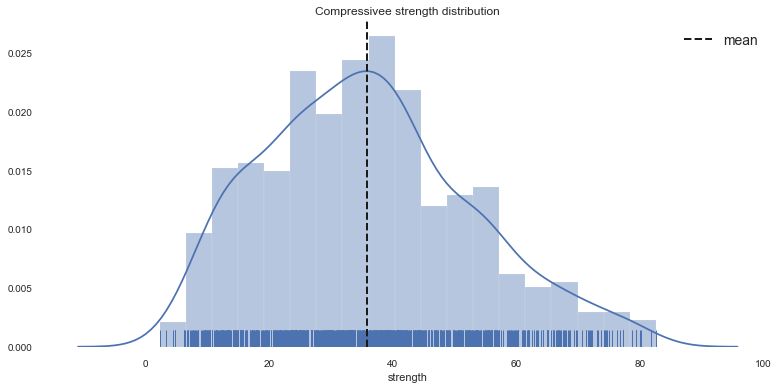

In [10]:
plt.figure(figsize=(13,6))
sns.distplot(df["strength"],color="b",rug=True)
plt.axvline(df["strength"].mean(),
            linestyle="dashed",color="k",
            label='mean',linewidth=2)
plt.legend(loc="best",prop={"size":14})
plt.title("Compressivee strength distribution")
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12fce55d0>,
      dtype=object)

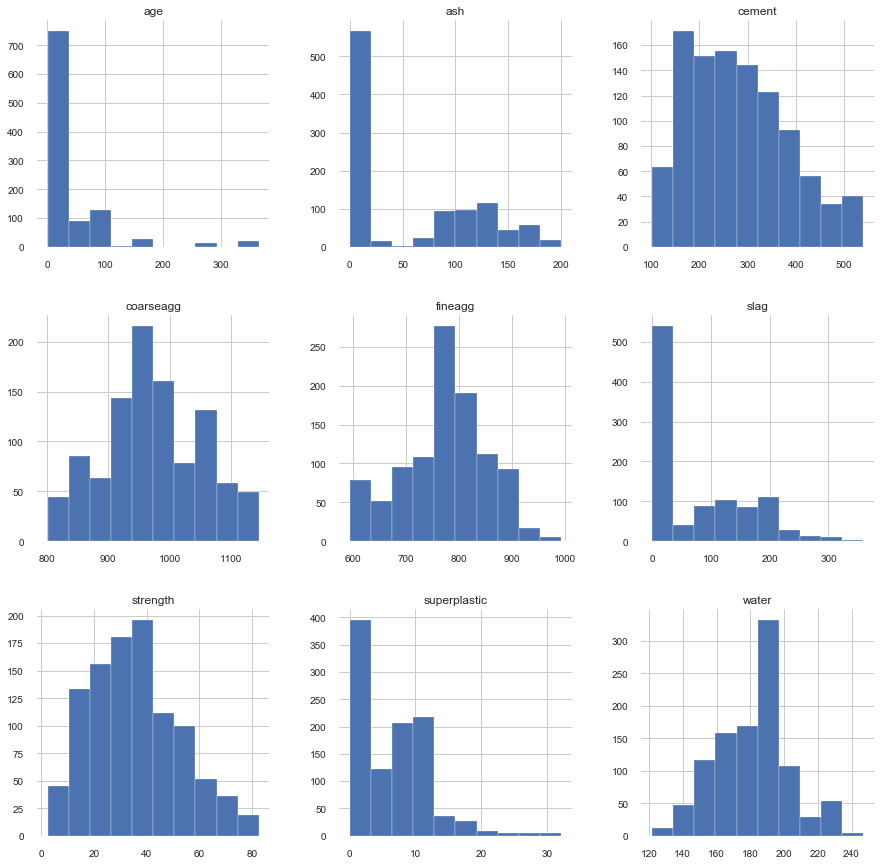

In [11]:
# Histogram 
df.hist(figsize=(15,15))

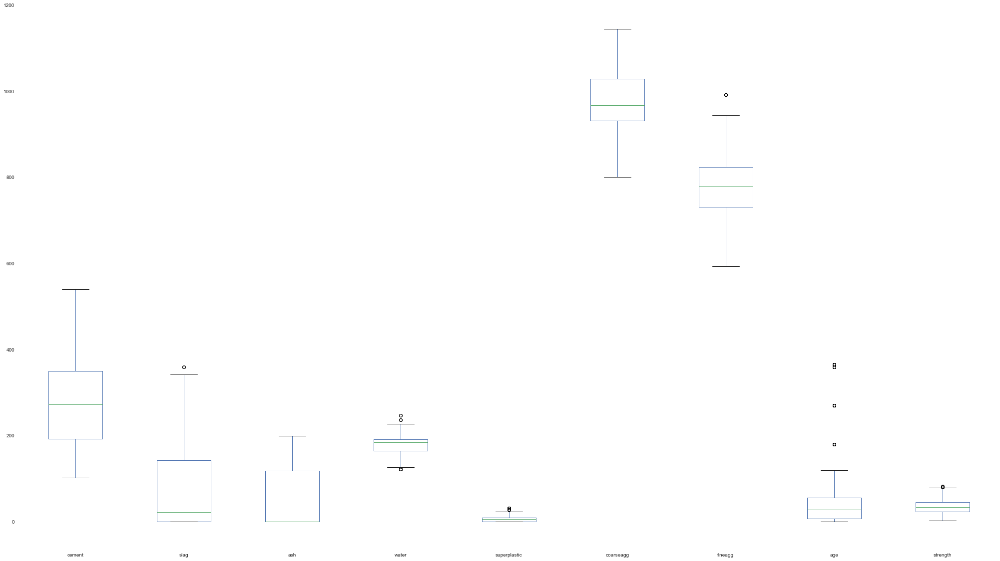

In [12]:
#Boxplot to understand spread and outliers
df.plot(kind='box', figsize=(35,20))

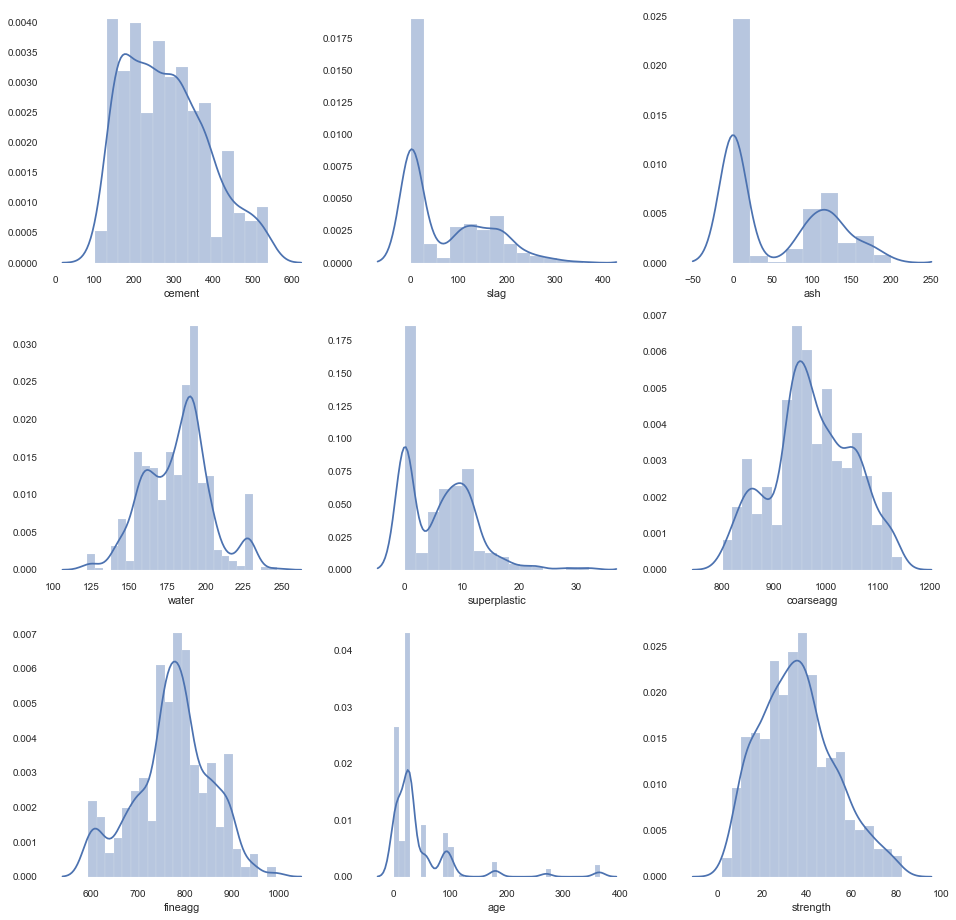

In [13]:
# Distplot for the dataframe
fig, ax2 = plt.subplots(3, 3, figsize=(16, 16))
sns.distplot(df['cement'],ax=ax2[0][0])
sns.distplot(df['slag'],ax=ax2[0][1])
sns.distplot(df['ash'],ax=ax2[0][2])
sns.distplot(df['water'],ax=ax2[1][0])
sns.distplot(df['superplastic'],ax=ax2[1][1])
sns.distplot(df['coarseagg'],ax=ax2[1][2])
sns.distplot(df['fineagg'],ax=ax2[2][0])
sns.distplot(df['age'],ax=ax2[2][1])
sns.distplot(df['strength'],ax=ax2[2][2])

We can see observe that :

cement is almost normal.

slag has two gausssians and rightly skewed.

ash has two gaussians and rightly skewed.

water has three guassians and slighly left skewed.

superplastic has two gaussians and rightly skewed.

coarseagg has three guassians and almost normal.

fineagg has almost two guassians and looks like normal.

age has multiple guassians and rightly skewed.
 

# MULTIVARIATE ANALYSIS

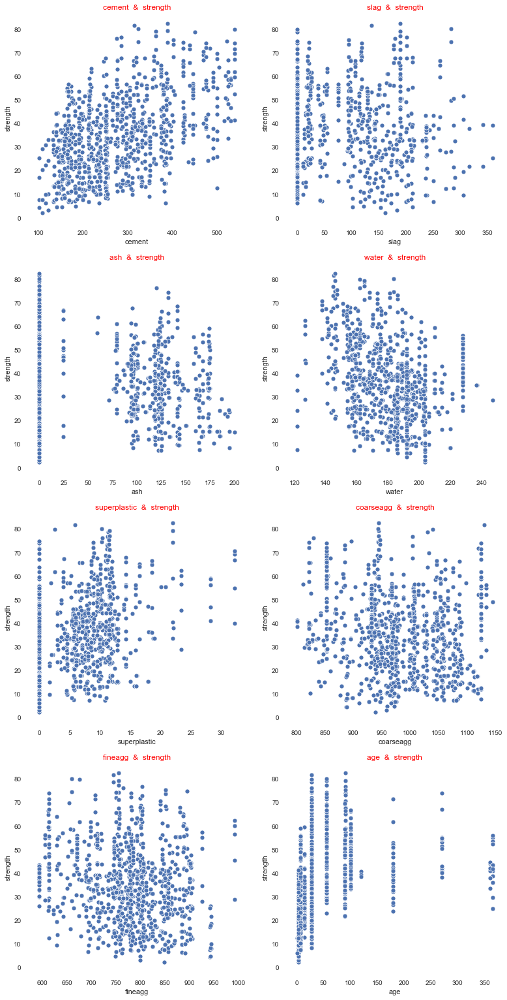

In [14]:
import itertools
cols = [i for i in df.columns if i not in 'strength']
length = len(cols)

plt.figure(figsize=(13,27))
for i,j in itertools.zip_longest(cols,range(length)):
    plt.subplot(4,2,j+1)
    sns.scatterplot(df[i], df["strength"])
    plt.title(i+"  &  strength",color="red")

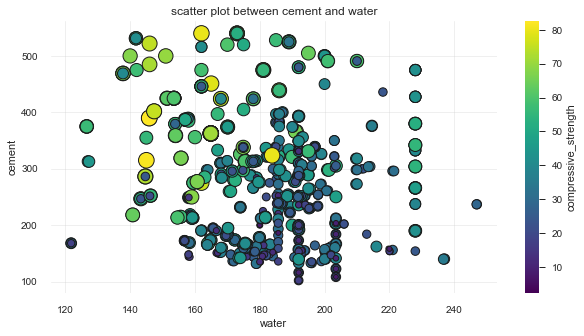

In [15]:
#Scatter Plot between Cement and Water
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
plt.scatter(df["water"],df["cement"],
            c=df["strength"],s=df["strength"]*3,
            linewidth=1,edgecolor="k",cmap="viridis")
ax.set_facecolor("w")
ax.set_xlabel("water")
ax.set_ylabel("cement")
lab = plt.colorbar()
lab.set_label("compressive_strength")
plt.title("scatter plot between cement and water")
plt.grid(True,alpha=.3)
plt.show()

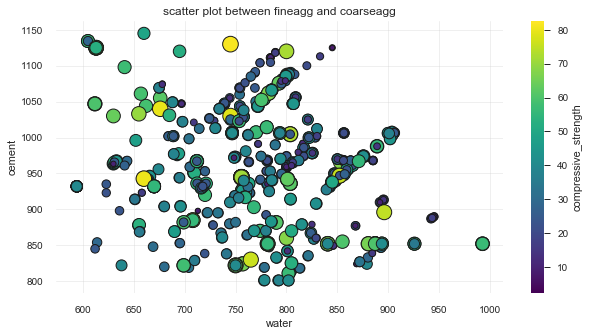

In [16]:
#Scatter Plot between Fineagg and Coarseagg
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
plt.scatter(df["fineagg"],df["coarseagg"],
            c=df["strength"],s=df["strength"]*3,
            linewidth=1,edgecolor="k",cmap="viridis")
ax.set_facecolor("w")
ax.set_xlabel("water")
ax.set_ylabel("cement")
lab = plt.colorbar()
lab.set_label("compressive_strength")
plt.title("scatter plot between fineagg and coarseagg")
plt.grid(True,alpha=.3)
plt.show()

# CHECKING FOR OUTLIERS AND TREATING IT

In [17]:
num_var= df.drop(['strength'],axis=1)
q3 = num_var.quantile(0.75)
q1 = num_var.quantile(0.25)
iqr = q3 - q1
print('IQR for numerical attributes')
print(iqr)

IQR for numerical attributes
cement          157.625
slag            142.950
ash             118.300
water            27.100
superplastic     10.200
coarseagg        97.400
fineagg          93.050
age              49.000
dtype: float64


In [18]:
data_out= df[~((num_var < (q1 - 1.5 * iqr)) |(num_var > (q3 + 1.5 * iqr))).any(axis=1)]
print('{} points are outliers based on IQR'.format(df.shape[0] - data_out.shape[0]))

85 points are outliers based on IQR


In [19]:
data_out.shape

(945, 9)

In [20]:
df1 = df.copy()

# Replace every outlier on the lower side by the lower whisker
for i, j in zip(np.where(num_var < q1 - 1.5 * iqr)[0], np.where(num_var < q1 - 1.5 * iqr)[1]):  
    
    whisker  = q1 - 1.5 * iqr
    df1.iloc[i,j] = whisker[j]
    
    
#Replace every outlier on the upper side by the upper whisker    
for i, j in zip(np.where(num_var > q3 + 1.5 * iqr)[0], np.where(num_var > q3 + 1.5 * iqr)[1]):
    
    whisker  = q3 + 1.5 * iqr
    df1.iloc[i,j] = whisker[j]
    

In [21]:
df1.shape,df.shape

((1030, 9), (1030, 9))

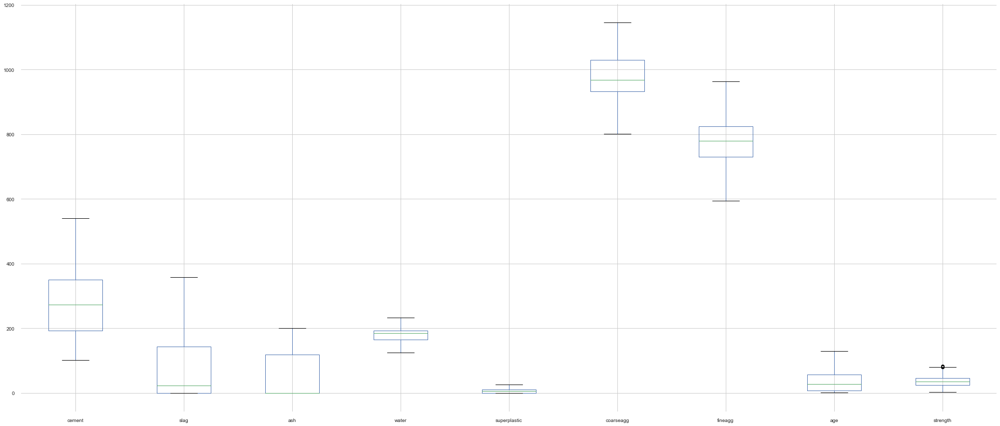

In [22]:
# again check for outliers in dataset using boxplot
df1.boxplot(figsize=(35,15))

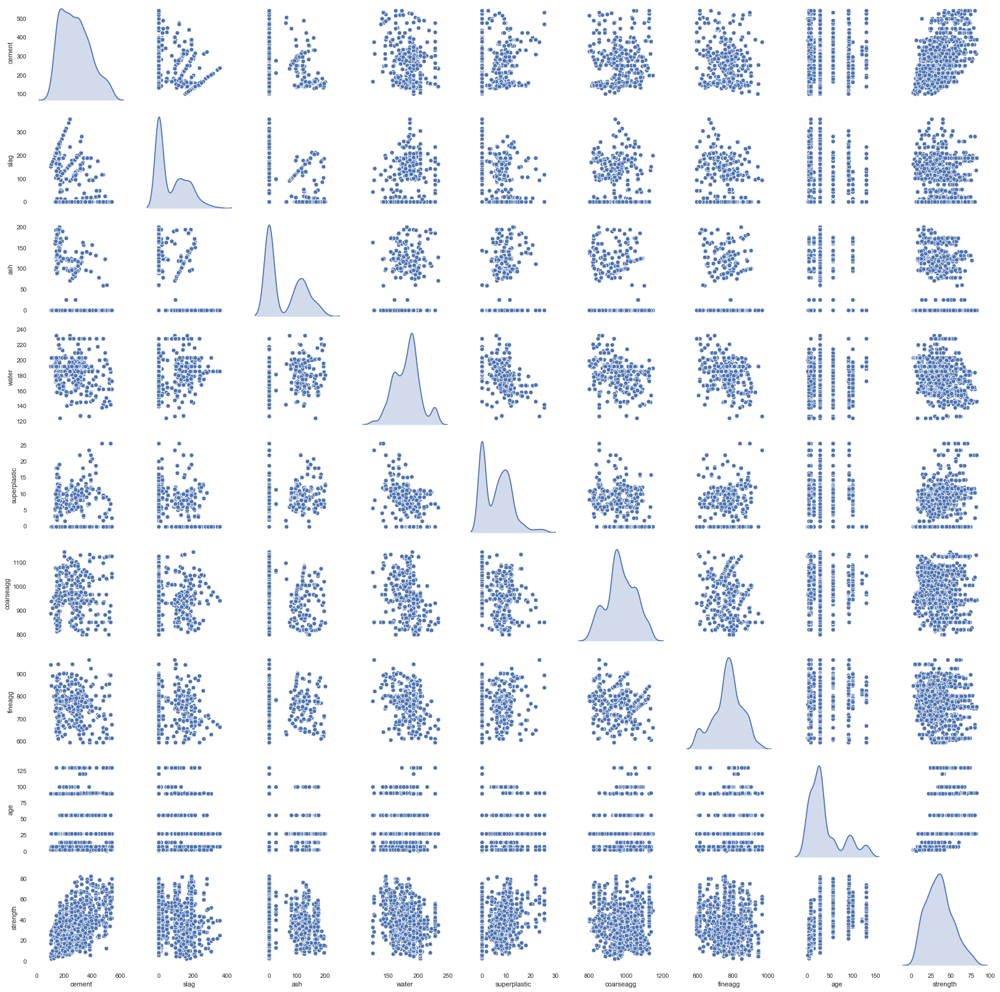

In [23]:
# pairplot- plot density curve instead of histogram in diagonal
sns.pairplot(df1, diag_kind='kde') 


#  Off Diagonals Analysis:

## Relationship between indpendent attributes
### Scatter plots
cement vs other independent attributes: This attribute does not have any significant relation with slag, ash, water, superplatic, coarseagg,fineagg and age. It almost spread like a cloud. If we had calculated the r value it would have come close to 0.

slag vs other independent attributes: This attribute also does not have any significant relation with ash, water, superplatic, coarseagg,fineagg and age. It almost spread like a cloud. If we had calculated the r value it would have come close to 0.

ash vs other independent attributes: This attribute also does not have any significant relation with water, superplatic, coarseagg,fineagg and age. It almost spread like a cloud. If we had calculated the r value it would have come close to 0.

water vs other independent attributes: This attribute have negative linear relationship with superplastic and fineagg. It does not have any significant relationship with other independent atributes. This is true as Superplasticizers allows the reduction of water in the concrete upto the extent of 30% without reducing the workability.

superplastic vs other independent attributes:This attribute have negative linear relationship with water only. It does not have any significant relationship with other independent attributes.

coarseagg vs other independent attributes:This attribute also does not have any significant relation with any other attributes. It almost spread like a cloud. If we had calculated the r value it would have come close to 0.
fineagg vs other independent attributes:It has negative linear relationship with water. It does not have any significant relation with any other attributes. It almost spread like a cloud. If we had calculated the r value it would have come close to 0.

The reason why we are doing all this analysis is if we find any kind of dimensions which are very strongly correlated i.e. r value close to 1 or -1 such dimensions are giving same information to your algorithms, its a redundant dimension. So in such cases we may want to keep one and drop the other which we should keep and which we should drop depends on again your domain expertise, which one of the dimension is more prone to errors.I would like to drop that dimension. Or we have a choice to combine these dimensions and create a composite dimension out of it.


# Data Preprocessing and feature engineering are the two things that can help in building better models.
Looking at the distributions, we can see that not all input features are normally distributed with a couple of them being bimodal. We can apply transformations to these features.

Some variables are correlated significantly (water and fly_ash, water and coarse_agg, coarse agg and fine_agg). This might give rise to multicollinearity and that must be fixed before making the models that are not tree-based.

A key factor in concrete engineering is the water-cement ratio. We can calculate more ratios involving our features and build different models involving those ratios. Later we can measure the model performance and discuss with domain experts to decide which ones are most important.


In [24]:
# corrlation matrix 
cor=df.corr()
cor

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
cement,1.000000,-0.275216,-0.397467,-0.081587,0.092386,-0.109349,-0.222718,0.081946,0.497832
slag,-0.275216,1.000000,-0.323580,0.107252,0.043270,-0.283999,-0.281603,-0.044246,0.134829
ash,-0.397467,-0.323580,1.000000,-0.256984,0.377503,-0.009961,0.079108,-0.154371,-0.105755
water,-0.081587,0.107252,-0.256984,1.000000,-0.657533,-0.182294,-0.450661,0.277618,-0.289633
superplastic,0.092386,0.043270,0.377503,-0.657533,1.000000,-0.265999,0.222691,-0.192700,0.366079
coarseagg,-0.109349,-0.283999,-0.009961,-0.182294,-0.265999,1.000000,-0.178481,-0.003016,-0.164935
fineagg,-0.222718,-0.281603,0.079108,-0.450661,0.222691,-0.178481,1.000000,-0.156095,-0.167241
age,0.081946,-0.044246,-0.154371,0.277618,-0.192700,-0.003016,-0.156095,1.000000,0.328873
strength,0.497832,0.134829,-0.105755,-0.289633,0.366079,-0.164935,-0.167241,0.328873,1.000000


In [25]:
# corrlation matrix 
cor1=df1.corr()
cor1

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
cement,1.000000,-0.275239,-0.397467,-0.081617,0.079619,-0.109349,-0.225311,0.054325,0.497832
slag,-0.275239,1.000000,-0.323590,0.107031,0.043724,-0.284023,-0.283263,-0.052703,0.134859
ash,-0.397467,-0.323590,1.000000,-0.258379,0.395319,-0.009961,0.080962,-0.092704,-0.105755
water,-0.081617,0.107031,-0.258379,1.000000,-0.665260,-0.180249,-0.448979,0.189637,-0.291203
superplastic,0.079619,0.043724,0.395319,-0.665260,1.000000,-0.261624,0.216947,-0.122913,0.366375
coarseagg,-0.109349,-0.284023,-0.009961,-0.180249,-0.261624,1.000000,-0.176542,0.012295,-0.164935
fineagg,-0.225311,-0.283263,0.080962,-0.448979,0.216947,-0.176542,1.000000,-0.096565,-0.169584
age,0.054325,-0.052703,-0.092704,0.189637,-0.122913,0.012295,-0.096565,1.000000,0.469625
strength,0.497832,0.134859,-0.105755,-0.291203,0.366375,-0.164935,-0.169584,0.469625,1.000000


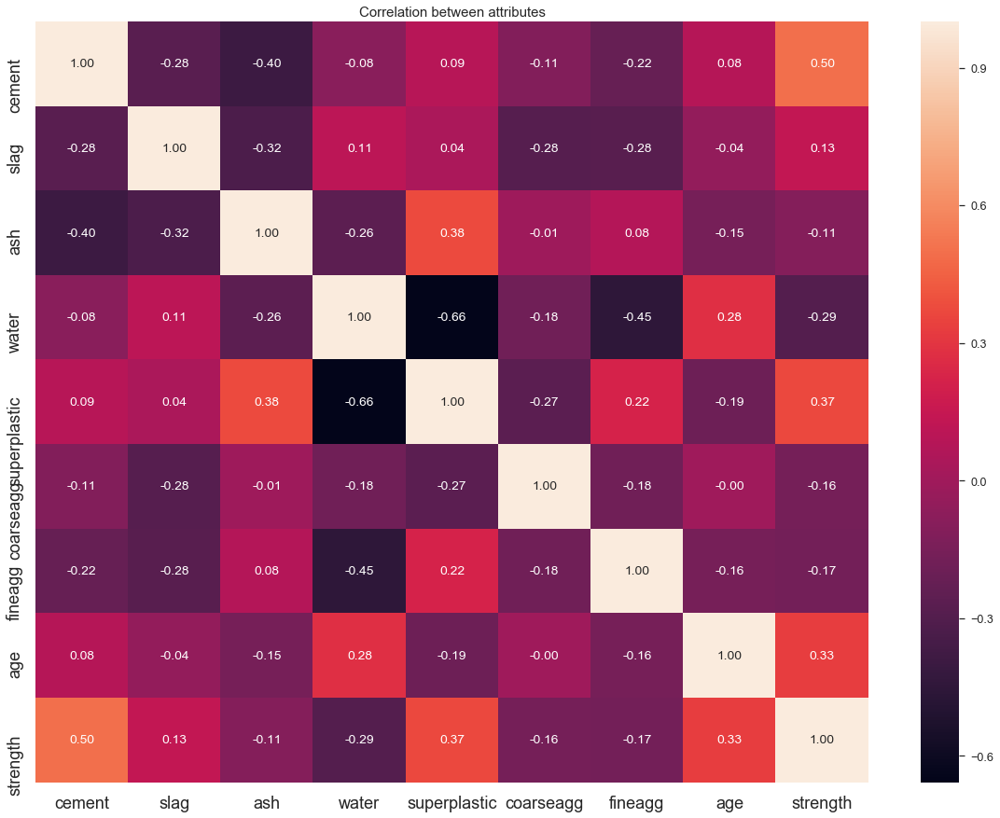

In [26]:
#corelation plot---heatmap
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(20,15))
hm1 =sns.heatmap(cor, annot=True,fmt= '.2f')
bottom,top=hm1.get_ylim()
hm1.set_ylim(bottom +.5,top -.5)
plt.title('Correlation between attributes',fontsize=15)
ax.tick_params(labelsize=18)

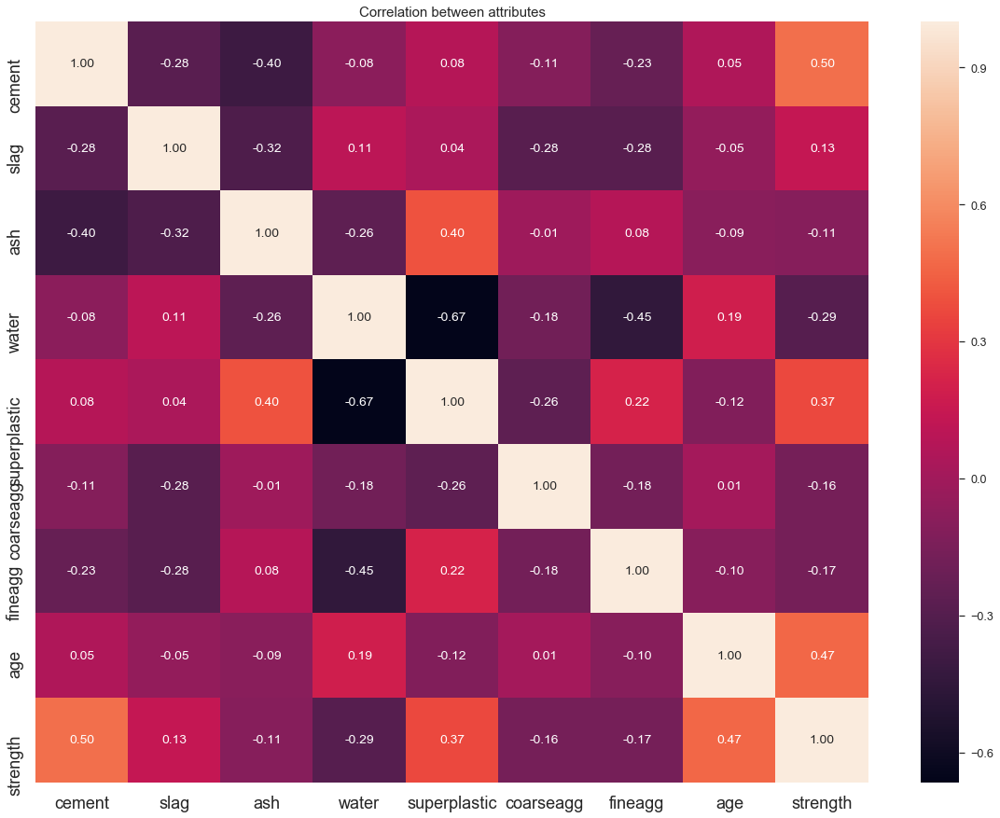

In [27]:
#corelation plot---heatmap
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(20,15))
hm1 =sns.heatmap(cor1, annot=True,fmt= '.2f')
bottom,top=hm1.get_ylim()
hm1.set_ylim(bottom +.5,top -.5)
plt.title('Correlation between attributes',fontsize=15)
ax.tick_params(labelsize=18)

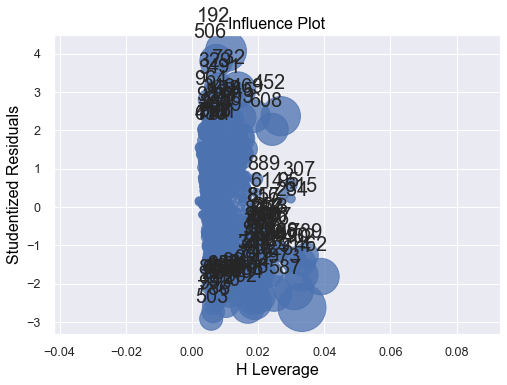

In [30]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
results=smf.ols('strength ~ cement +slag + ash + water +superplastic +coarseagg +fineagg +age',data=df1).fit()
sm.graphics.influence_plot(results)
plt.show()

# Feature Engineering, Model Building and Model Tuning

## Scaling the features


In [31]:
# Splitting the data into independent and dependent attributes
X=df1.drop('strength',axis=1)
y=df1['strength']

In [32]:
sc = StandardScaler()
X = sc.fit_transform(X)#Scaling the X varaibles in the dataset

In [33]:
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 25)



In [34]:
import statsmodels.api as sm
est=sm.OLS(y_train,X_train)
result=est.fit() 
print(result.summary2()) 

                        Results: Ordinary least squares
Model:                  OLS              Adj. R-squared (uncentered): 0.158    
Dependent Variable:     strength         AIC:                         7264.0245
Date:                   2020-06-14 12:42 BIC:                         7300.6696
No. Observations:       721              Log-Likelihood:              -3624.0  
Df Model:               8                F-statistic:                 17.94    
Df Residuals:           713              Prob (F-statistic):          1.50e-24 
R-squared (uncentered): 0.168            Scale:                       1374.7   
------------------------------------------------------------------------------------
            Coef.       Std.Err.         t         P>|t|        [0.025        0.975]
------------------------------------------------------------------------------------
x1         12.3519        3.7573       3.2874      0.0011        4.9752      19.7287
x2          9.4144        3.7213       2.529

# DECISION TREE

In [35]:
dt_model = DecisionTreeRegressor(random_state=18)
dt_model.fit(X_train , y_train)
y_pred=dt_model.predict(X_test)
# performance on train data
print('Performance on training data using DT:',dt_model.score(X_train,y_train))
# performance on test data
print('Performance on testing data using DT:',dt_model.score(X_test,y_test))
print('MSE: ',metrics.mean_squared_error(y_test, y_pred))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
#Evaluate the model using accuracy
acc_DT=metrics.r2_score(y_test,y_pred)
print('Accuracy Linear_pipeline: ',acc_DT)
mse_dt=mean_squared_error(y_test, y_pred)
print(mse_dt)

Performance on training data using DT: 0.9954698895855629
Performance on testing data using DT: 0.813308764014022
MSE:  47.91735355987055
RMSE:  6.922236167588516
Accuracy Linear_pipeline:  0.813308764014022
47.91735355987055


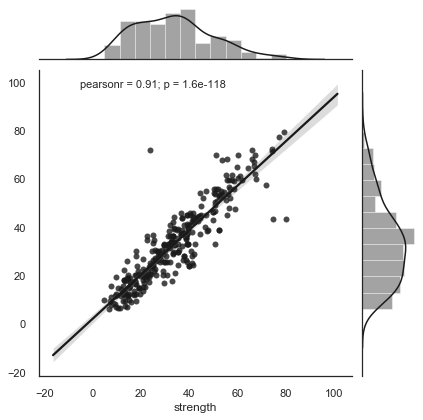

In [36]:
import warnings
warnings.filterwarnings("ignore")

from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test, y=y_pred, stat_func=pearsonr,kind="reg", color="k");

In [37]:
## Calculating feature importance
feature_cols = df.columns
feat_importance = dt_model.tree_.compute_feature_importances(normalize=False)


feat_imp_dict = dict(zip(feature_cols,dt_model.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False) 

,0
cement,0.379693
age,0.297381
water,0.119649
slag,0.089122
coarseagg,0.039202
superplastic,0.037926
fineagg,0.029769
ash,0.007259


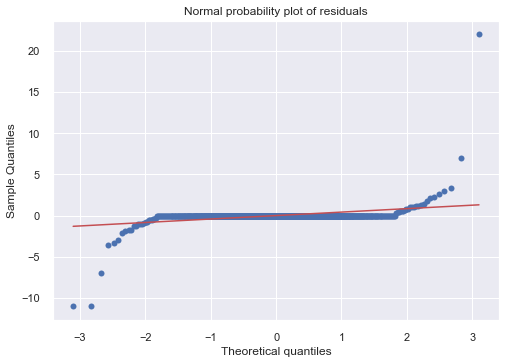

In [38]:
# Normal probability plot of residuals

predicted_values = dt_model.predict(X_train)
residuals = predicted_values - y_train

from scipy import stats
import matplotlib.pyplot as plt

predicted_values = dt_model.predict(X_train)
residuals = predicted_values - y_train

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()



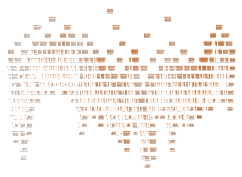

In [39]:


from sklearn.tree import plot_tree
plt.figure(figsize=(4,3))
a = plot_tree(dt_model, 
              feature_names=feature_cols, 
              class_names=df1['strength'], 
              filled=True, 
              rounded=True)

In [40]:
#Store the accuracy results for each model in a dataframe for final comparison
results = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT, 'mean_squared_error':mse_dt},index={'1'})
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354


In [41]:
# Dropping less important FEATURE and using pipeline also to check

x=df1.drop(['strength','ash'],axis=1)
y=df1['strength']

from sklearn.pipeline import Pipeline

x_train2, x_test2, y_train2, y_test2 = train_test_split(x,y, test_size = 0.3, random_state = 25)

scl = StandardScaler().fit(x)

pipe_dt = Pipeline([('scl', StandardScaler()), ('dt', DecisionTreeRegressor(random_state=18))]) 
pipe_dt.fit(x_train2, y_train2) 
y_pred2=pipe_dt.predict(x_test2) 
print('Train Accuracy: %.3f' % pipe_dt.score(x_train2, y_train2))
print('Test Accuracy: %.3f' % pipe_dt.score(x_test2, y_test2))
# performance on test data
print('Performance on testing data using DT:',pipe_dt.score(x_test2, y_test2))
print('MSE: ',metrics.mean_squared_error(y_test2, y_pred2))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test2, y_pred2)))
#Evaluate the model using accuracy
acc_DT_pipe=metrics.r2_score(y_test2, y_pred2)
print('Accuracy DT_pipeline: ',acc_DT_pipe)
mse2= mean_squared_error(y_test2, y_pred2)
mse2


Train Accuracy: 0.995
Test Accuracy: 0.811
Performance on testing data using DT: 0.8114568708709435
MSE:  48.39267216828479
RMSE:  6.9564841815593015
Accuracy DT_pipeline:  0.8114568708709435


48.39267216828479

In [42]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree-Pipeline-removing unimportant feature'], 'accuracy': acc_DT_pipe,'mean_squared_error':mse2},index={'2'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672


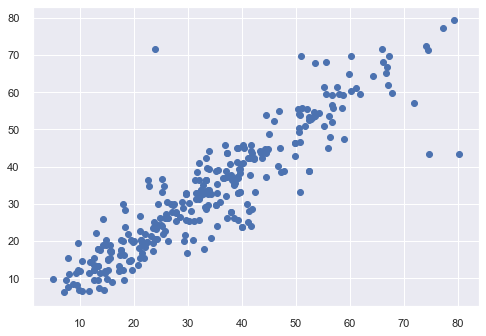

In [43]:
# Plotting Actaul vs Predicted Values
plt.scatter(y_test, y_pred)

# COMPLEXITY OF THE MODEL-APPLYING  3 DEGREE POLYNOMIAL

In [44]:
from sklearn.preprocessing import PolynomialFeatures 
poly = PolynomialFeatures( degree = 3, include_bias = False) 
x_poly = poly.fit_transform(x)
x_poly

array([[1.41300000e+02, 2.12000000e+02, 2.03500000e+02, ...,
        1.56870630e+07, 5.86824000e+05, 2.19520000e+04],
       [1.68900000e+02, 4.22000000e+01, 1.58300000e+02, ...,
        8.87508216e+06, 1.56055200e+05, 2.74400000e+03],
       [2.50000000e+02, 0.00000000e+00, 1.87400000e+02, ...,
        2.07666323e+07, 6.75180800e+05, 2.19520000e+04],
       ...,
       [2.76400000e+02, 1.16000000e+02, 1.79600000e+02, ...,
        1.65279769e+07, 6.02347200e+05, 2.19520000e+04],
       [3.42000000e+02, 3.80000000e+01, 2.28000000e+02, ...,
        5.81325500e+07, 1.12360675e+07, 2.17174738e+06],
       [5.40000000e+02, 0.00000000e+00, 1.73000000e+02, ...,
        2.63038300e+06, 3.00370000e+04, 3.43000000e+02]])

In [45]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x_poly,y, test_size = 0.3, random_state = 25)

In [46]:
import statsmodels.api as sm
est=sm.OLS(y_train1,x_train1)
result=est.fit() 
print(result.summary2()) 

                 Results: Ordinary least squares
Model:              OLS              Adj. R-squared:     0.907    
Dependent Variable: strength         AIC:                4517.1544
Date:               2020-06-14 12:43 BIC:                5062.2504
No. Observations:   721              Log-Likelihood:     -2139.6  
Df Model:           118              F-statistic:        60.74    
Df Residuals:       602              Prob (F-statistic): 2.20e-269
R-squared:          0.923            Scale:              26.510   
--------------------------------------------------------------------
        Coef.     Std.Err.      t      P>|t|      [0.025     0.975] 
--------------------------------------------------------------------
x1      29.5246     6.6979    4.4080   0.0000     16.3704    42.6787
x2      23.7430    10.8000    2.1984   0.0283      2.5328    44.9532
x3     -37.0906    31.4481   -1.1794   0.2387    -98.8519    24.6708
x4     138.7784   189.0837    0.7340   0.4633   -232.5654   510.1222

In [47]:
dt_model2 = DecisionTreeRegressor(random_state=25)
dt_model2.fit(x_train1 , y_train1)
y_pred1=dt_model2.predict(x_test1)
# performance on train data
print('Performance on training data using DT:',dt_model2.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',dt_model2.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred1)))
#Evaluate the model using accuracy
acc_DT_poly=metrics.r2_score(y_test1, y_pred1)
print('Accuracy DT_pipeline: ',acc_DT_poly)
mse3= mean_squared_error(y_test1, y_pred1)
mse3

Performance on training data using DT: 0.9954698895855629
Performance on testing data using DT: 0.8214487111568507
MSE:  45.82810323624595
RMSE:  6.769645724574215
Accuracy DT_pipeline:  0.8214487111568507


45.82810323624595

In [48]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree- Polynomial feature'], 'accuracy': acc_DT_poly,'mean_squared_error':mse3},index={'3'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103


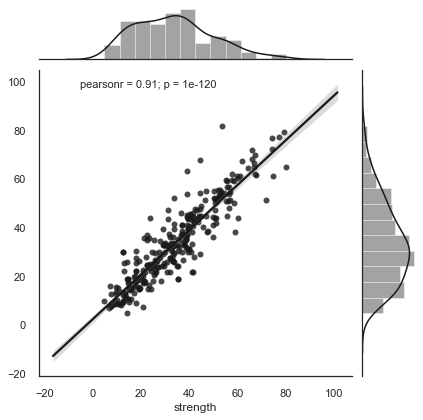

In [49]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=y_pred1, stat_func=pearsonr,kind="reg", color="k");

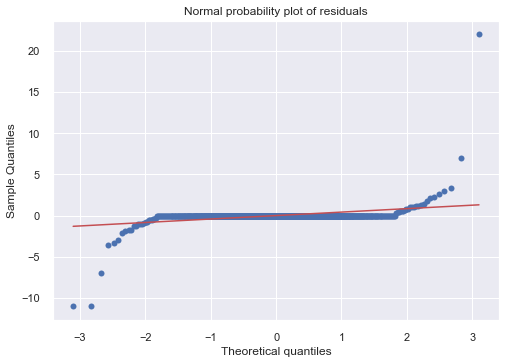

In [50]:
predicted_values = dt_model2.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [51]:
from sklearn.model_selection import GridSearchCV

In [52]:
# Define a grid of hyperparameter 'params_dt'
params_dt = {
             "max_depth": [None, 1, 2, 3, 4, 5, 6, 7], 
             "min_samples_leaf": range(1, 3),
             "min_samples_split": range(2, 10),
             "max_leaf_nodes": range(10,18)}
                
# Instantiate 'grid_dt' 
grid_dt = GridSearchCV(estimator=dt_model2, 
                       param_grid=params_dt,
                       cv= 7,)

# Fit 'grid_dt' to the training set
grid_dt.fit(x_train1, y_train1)

GridSearchCV(cv=7, error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=25, splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [None, 1, 2, 3, 4, 5, 6, 7],
                         'max_leaf_nodes': range(10, 18),
                         'min_samples_leaf': range(1, 3),
                   

In [53]:
# Extract best hyperparameters from 'grid_dt'
best_hyperparams = grid_dt.best_params_ 
print('Best hyerparameters:\n', best_hyperparams)

Best hyerparameters:
 {'max_depth': 5, 'max_leaf_nodes': 17, 'min_samples_leaf': 2, 'min_samples_split': 2}


In [54]:
#APPLYING GRIDSEARCH VALUES 
dt_model3 = DecisionTreeRegressor(max_depth=5,max_leaf_nodes=17,min_samples_leaf=2,min_samples_split=2,random_state=99,ccp_alpha=.002)
dt_model3.fit(x_train1 , y_train1)
y_pred3=dt_model3.predict(x_test1)
# performance on train data
print('Performance on training data using DT:',dt_model3.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',dt_model3.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred3))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred3)))
#Evaluate the model using accuracy
acc_DT_Grid=metrics.r2_score(y_test1, y_pred3)
print('Accuracy DT_pipeline: ',acc_DT_Grid)
mse4= mean_squared_error(y_test1, y_pred3)
mse4

Performance on training data using DT: 0.8616001932921833
Performance on testing data using DT: 0.7663930905049378
MSE:  59.95902709190015
RMSE:  7.743321450895613
Accuracy DT_pipeline:  0.7663930905049378


59.95902709190015

In [55]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree Polynomial -Gridsearch'], 'accuracy': acc_DT_Grid ,'mean_squared_error':mse4},index={'4'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027


In [56]:

num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results1 = cross_val_score(dt_model2,x_poly, y, cv=kfold)
accuracy=np.mean(abs(results1))
print('Average accuracy: ',accuracy)
print('Standard Deviation: ',results1.std())



Average accuracy:  0.8468458346416645
Standard Deviation:  0.030958365780138206


In [57]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree -Polynomial K fold'], 'accuracy': accuracy},index={'5'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN


## AS POLYNOMIAL FEATURES IMPROVING RESULTS AND DECREASING MEAN SQUARED ERROR, SO GOING FORWARD WE TAEK INTO CONSIDERATION THE TRAIN AND TEST SET OF POLYNOMIAL FEATURES

# Random Forest Regressor

In [58]:
rf_model=RandomForestRegressor(random_state=10)
rf_model.fit(x_train1, y_train1)
pred_rf=rf_model.predict(x_test1) 
# performance on train data
print('Performance on training data using RandomForest:',rf_model.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using RandomForest:',rf_model.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_rf))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_rf)))
#Evaluate the model using accuracy
rf_acc=metrics.r2_score(y_test1,pred_rf)
print('Accuracy Random Forest_pipeline: ',rf_acc)
mse_rf= mean_squared_error(y_test1, pred_rf)
mse_rf

Performance on training data using RandomForest: 0.9836508910501734
Performance on testing data using RandomForest: 0.9157271054522012
MSE:  21.630014190188653
RMSE:  4.650807907255325
Accuracy Random Forest_pipeline:  0.9157271054522012


21.630014190188653

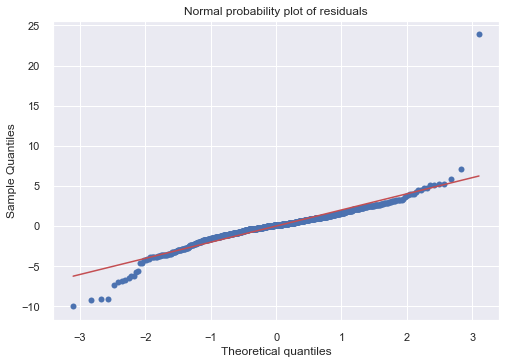

In [59]:
predicted_values = rf_model.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [60]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['RandomForest-Polynomial'], 'accuracy': rf_acc, 'mean_squared_error':mse_rf},index={'6'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014


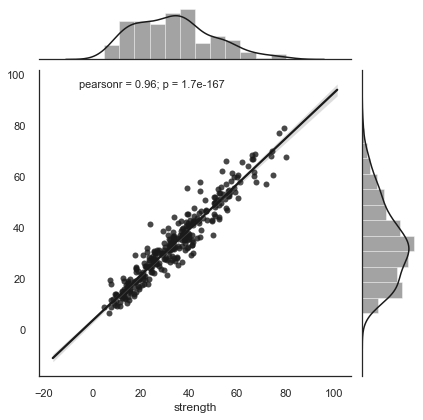

In [61]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_rf ,stat_func=pearsonr,kind="reg", color="k");

In [62]:
from sklearn.model_selection import RandomizedSearchCV 
params_rf = {"n_estimators": [ 25,50,80],
             "max_depth": [ 9,15,20], 
             "min_samples_leaf":[ 3,5,7],
             "min_samples_split":[4,5,6,7 ,8],
             "max_leaf_nodes": [17,18,19,],
             "max_features": ['auto', 'sqrt', 'log2']}
rf_1= RandomizedSearchCV(rf_model,params_rf, cv=7, n_jobs=-1, return_train_score=True)
rf_1.fit(x_train1, y_train1)
print('Best parameters:  {}'.format(rf_1.best_params_))
print(" Training score",rf_1.score(x_train1,y_train1))

Best parameters:  {'n_estimators': 25, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_leaf_nodes': 19, 'max_features': 'auto', 'max_depth': 15}
 Training score 0.9061283966654506


In [63]:
# RANDOMISED SEARCH RESULTS
rf_model1=RandomForestRegressor(min_samples_split= 5,max_features='auto' ,min_samples_leaf= 7, max_leaf_nodes= 18, max_depth =15,n_estimators=80,random_state=150)
rf_model1.fit(x_train1, y_train1)
rf_model1.fit(x_train1, y_train1)
pred_rf1=rf_model1.predict(x_test1) 
# performance on train data
print('Performance on training data using RandomForest:',rf_model1.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using RandomForest:',rf_model1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_rf1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_rf1)))
#Evaluate the model using accuracy
rf_acc1=metrics.r2_score(y_test1,pred_rf1)
print('Accuracy Random Forest_pipeline: ',rf_acc1)
mse_rf1= mean_squared_error(y_test1, pred_rf1)
mse_rf1

Performance on training data using RandomForest: 0.9026241841677084
Performance on testing data using RandomForest: 0.8651953523475567
MSE:  34.599813585041815
RMSE:  5.882160622172929
Accuracy Random Forest_pipeline:  0.8651953523475568


34.599813585041815

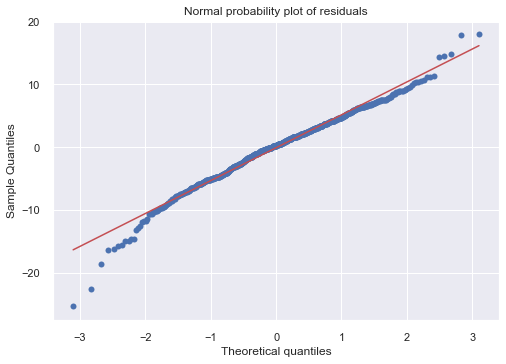

In [64]:
predicted_values = rf_model1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

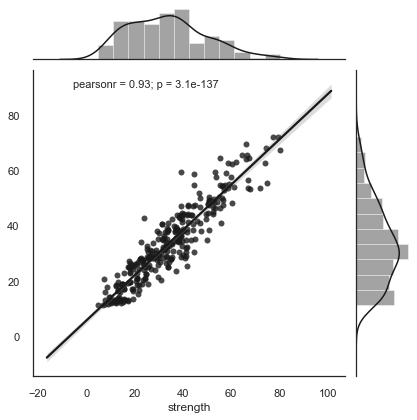

In [65]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_rf1 ,stat_func=pearsonr,kind="reg", color="k");

In [66]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['RandomForest-Polynomial Gridsearch'], 'accuracy': rf_acc1, 'mean_squared_error':mse_rf1},index={'7'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814


In [67]:
# KFOLD CROSS VALIDATION
num_folds =5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_rf = cross_val_score(rf_model,x_poly, y, cv=kfold)
accuracy_rf=np.mean(abs(results_rf))
print('Average accuracy: ',accuracy_rf)
print('Standard Deviation: ',results_rf.std())




Average accuracy:  0.9116033458881141
Standard Deviation:  0.019976879139617175


In [68]:
print(results_rf)

[0.88077385 0.93922427 0.90108745 0.92468011 0.91225105]


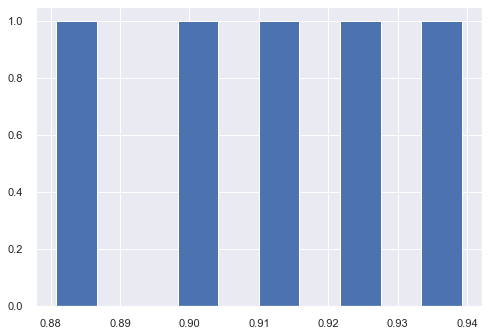

95.0 confidence interval 88.3% and 93.8%


In [69]:
# plot scores
plt.hist(results_rf)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_rf, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_rf, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [70]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['RandomForest-Polynomial-kfold'], 'accuracy': accuracy_rf},index={'8'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN


# BAGGING REGRESSOR

In [71]:
model_bg=BaggingRegressor(random_state=30)
model_bg.fit(x_train1, y_train1)
pred_bg=model_bg.predict(x_test1) 
# performance on train data
print('Performance on training data using Baggingclassifier:',model_bg.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using BaggingClassifier:',model_bg.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_bg))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_bg)))
#Evaluate the model using accuracy
bg_acc=metrics.r2_score(y_test1,pred_bg)
print('Accuracy Bagging Classifier_pipeline: ',bg_acc)
mse_bg=mean_squared_error(y_test1, pred_bg)
print(mse_bg)

Performance on training data using Baggingclassifier: 0.9748060259155001
Performance on testing data using BaggingClassifier: 0.9086781184773787
MSE:  23.439251776128998
RMSE:  4.841410102039384
Accuracy Bagging Classifier_pipeline:  0.9086781184773787
23.439251776128998


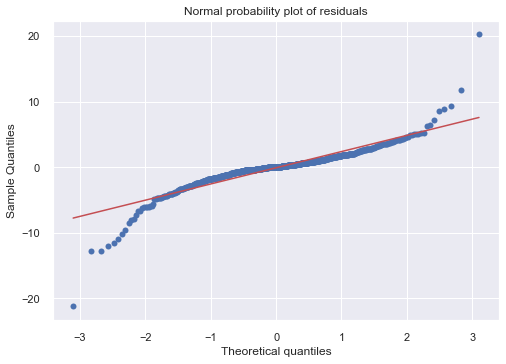

In [72]:
predicted_values = model_bg.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

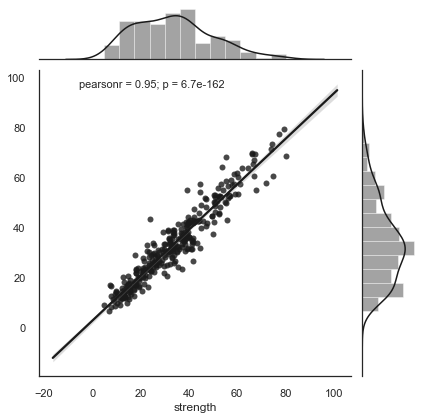

In [73]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_bg ,stat_func=pearsonr,kind="reg", color="k");

In [74]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Bagging-Polynomial'], 'accuracy': bg_acc, 'mean_squared_error':mse_bg},index={'9'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252


In [75]:
from sklearn.model_selection import RandomizedSearchCV 
params_bag = {'n_estimators': [10, 20, 30, 50, 70, 80, 100],
            'bootstrap': [True, False],
            'bootstrap_features': [True, False]}
bag_1= RandomizedSearchCV(model_bg,params_bag, cv=7, n_jobs=-1, return_train_score=True)
bag_1.fit(x_train1, y_train1)
print('Best parameters:  {}'.format(bag_1.best_params_))
print(" Training score",bag_1.score(x_train1,y_train1))

Best parameters:  {'n_estimators': 100, 'bootstrap_features': True, 'bootstrap': True}
 Training score 0.9838987980736666


In [76]:
# Randomized Search Results
model_bg1=BaggingRegressor(n_estimators=100,bootstrap_features= True, bootstrap= True,random_state=20)
model_bg1.fit(x_train1, y_train1)
pred_bg1=model_bg1.predict(x_test1) 
# performance on train data
print('Performance on training data using Baggingclassifier:',model_bg1.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using BaggingClassifier:',model_bg1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_bg1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_bg1)))
#Evaluate the model using accuracy
bg1_acc=metrics.r2_score(y_test1,pred_bg1)
print('Accuracy Bagging Classifier_pipeline: ',bg1_acc)
mse_bg1=mean_squared_error(y_test1, pred_bg1)
print(mse_bg1)

Performance on training data using Baggingclassifier: 0.9841514017176456
Performance on testing data using BaggingClassifier: 0.9199887313221672
MSE:  20.536198337116737
RMSE:  4.5316882435927495
Accuracy Bagging Classifier_pipeline:  0.9199887313221672
20.536198337116737


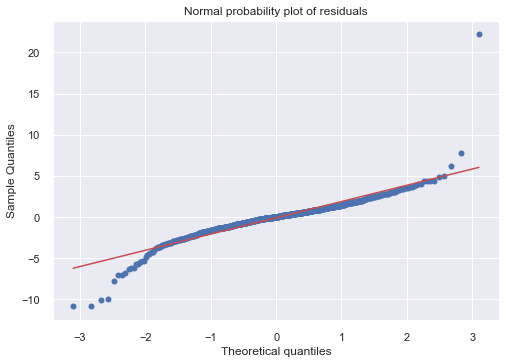

In [77]:
predicted_values = model_bg1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

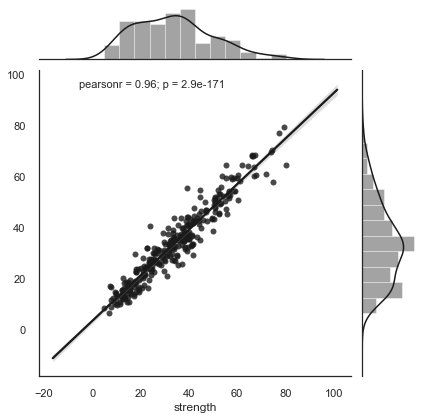

In [78]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_bg1 ,stat_func=pearsonr,kind="reg", color="k");

In [79]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Bagging-Polynomial Gridsearch'], 'accuracy': bg1_acc, 'mean_squared_error':mse_bg1},index={'10'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


In [80]:
num_folds =5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_bg1 = cross_val_score(model_bg1,x_poly, y, cv=kfold)
accuracy_bg1=np.mean(abs(results_bg1))
print('Average accuracy: ',accuracy_bg1)
print('Standard Deviation: ',results_bg1.std())



Average accuracy:  0.9145155340645698
Standard Deviation:  0.018001141009569226


In [81]:
print(results_bg1)

[0.89254629 0.94195415 0.89930756 0.92666418 0.9121055 ]


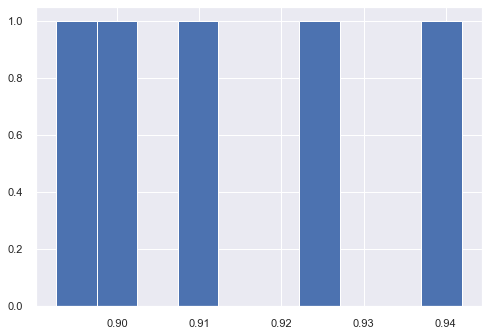

95.0 confidence interval 89.3% and 94.0%


In [82]:
# plot scores
plt.hist(results_bg1)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_bg1, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_bg1, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [83]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Bagging Gridsearch Kfold'], 'accuracy': accuracy_bg1},index={'11'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# GRADIENT BOOST REGRESSOR

In [84]:
model_gb=GradientBoostingRegressor(random_state=99)
model_gb.fit(x_train1, y_train1)
pred_gb=model_gb.predict(x_test1) 
# performance on train data
print('Performance on training data using GradientBoost:',model_gb.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using GradientBoost:',model_gb.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_gb))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_gb)))
#Evaluate the model using accuracy
acc_gb=metrics.r2_score(y_test1,pred_gb)
print('Accuracy GradientBoost_pipeline: ',acc_gb)
mse_gb=mean_squared_error(y_test1, pred_gb)
print(mse_gb)

Performance on training data using GradientBoost: 0.9685799395428376
Performance on testing data using GradientBoost: 0.9235626113092653
MSE:  19.618903692738296
RMSE:  4.429323164179635
Accuracy GradientBoost_pipeline:  0.9235626113092654
19.618903692738296


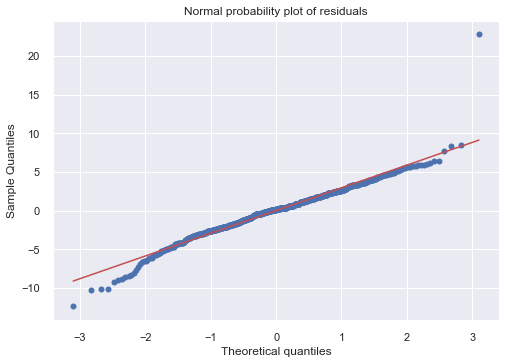

In [85]:
predicted_values = model_gb.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

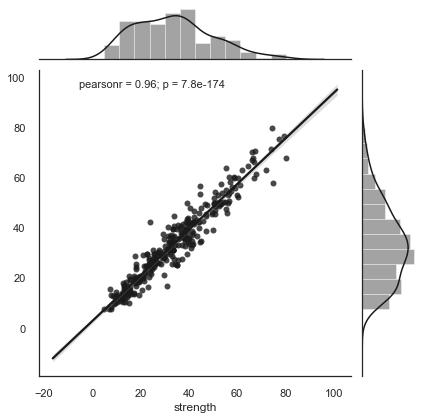

In [86]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_gb ,stat_func=pearsonr,kind="reg", color="k");

In [87]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['GradientBoost'], 'accuracy': acc_gb, 'mean_squared_error':mse_gb},index={'12'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


In [88]:
from sklearn.model_selection import RandomizedSearchCV 
params_gr = {'n_estimators': [10, 20, 30, 50, 70, 80, 100],
              'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5],
              'min_samples_split': [1.0, 2, 3, 5, 10],
              'min_samples_leaf': [1, 2, 3, 5, 10],
              'max_depth': [3, 5, 8],
              'max_features': ['log2', 'sqrt'],
              'criterion' : ['friedman_mse', 'mae'],
              'loss' : ['ls', 'lad', 'huber', 'quantile']}
gr= RandomizedSearchCV(model_gb,params_gr, cv=7, n_jobs=-1, return_train_score=True)
gr.fit(x_train1, y_train1)
print('Best parameters:  {}'.format(gr.best_params_))
print(" Training score",gr.score(x_train1,y_train1))

Best parameters:  {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'max_depth': 8, 'loss': 'huber', 'learning_rate': 0.05, 'criterion': 'friedman_mse'}
 Training score 0.9822532677594706


In [89]:
# RANDOMIZED SEARCH RESULTS
from math import sqrt
model_gb1=GradientBoostingRegressor(random_state=55,n_estimators= 70, min_samples_split= 3, min_samples_leaf= 3 ,max_depth= 8, learning_rate=0.2)
model_gb1.fit(x_train1, y_train1)
pred_gb1=model_gb1.predict(x_test1) 
# performance on train data
print('Performance on training data using GradientBoost:',model_gb1.score(x_train1,y_train1))
# performance on test data 
print('Performance on testing data using GradientBoost:',model_gb1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_gb1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_gb1)))
#Evaluate the model using accuracy
acc_gb1=metrics.r2_score(y_test1,pred_gb1)
print('Accuracy GradientBoost_pipeline: ',acc_gb1)
mse_gb1=mean_squared_error(y_test1, pred_gb1)
print(mse_gb1)

Performance on training data using GradientBoost: 0.9954428514437518
Performance on testing data using GradientBoost: 0.9064917306313726
MSE:  24.0004239108721
RMSE:  4.8990227505975215
Accuracy GradientBoost_pipeline:  0.9064917306313726
24.0004239108721


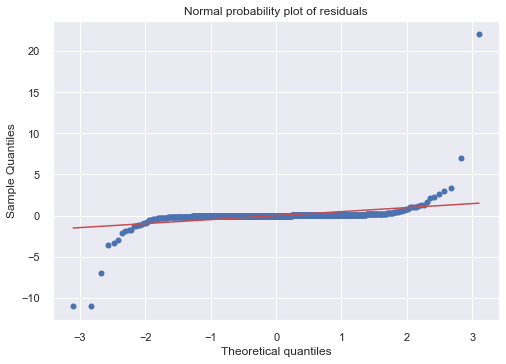

In [90]:
predicted_values = model_gb1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

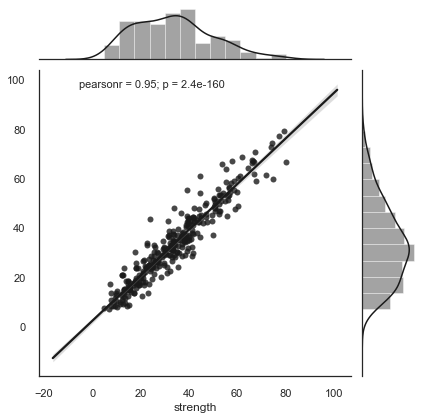

In [91]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_gb1 ,stat_func=pearsonr,kind="reg", color="k");

In [92]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['GradientBoost-Gridsearch'], 'accuracy': acc_gb1, 'mean_squared_error':mse_gb1},index={'13'})
results = pd.concat([results, tempResultsDf]) 
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


In [93]:
num_folds =5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_gb = cross_val_score(model_gb,x_poly, y, cv=kfold)
accuracy_gb=np.mean(abs(results_gb))
print('Average accuracy: ',accuracy_gb)
print('Standard Deviation: ',results_gb.std())

Average accuracy:  0.9148742220927574
Standard Deviation:  0.02044965723187934


In [94]:
print(results_gb)

[0.88120899 0.93492421 0.90813182 0.93735986 0.91274623]


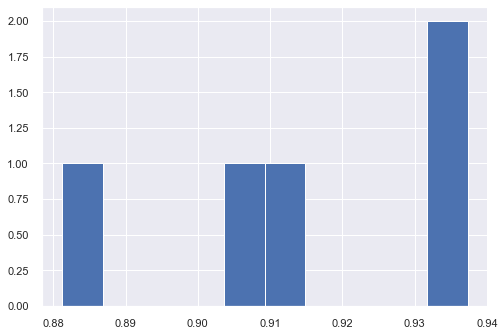

95.0 confidence interval 88.4% and 93.7%


In [95]:
# plot scores
plt.hist(results_gb)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_gb, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_gb, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [96]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost-Polynomial Kfold'], 'accuracy': accuracy_gb},index={'14'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']] 
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# ADABOOST-BASE MODEL RANDOM FOREST

In [97]:

model_adb=AdaBoostRegressor(base_estimator=rf_model,random_state=20)
model_adb.fit(x_train1, y_train1)
pred_adb=model_adb.predict(x_test1) 
# performance on train data
print('Performance on training data using AdaBoost:',model_adb.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using ADABoost:',model_adb.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_adb))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_adb)))
#Evaluate the model using accuracy
acc_adb=metrics.r2_score(y_test1,pred_adb)
mse_adb=mean_squared_error(y_test1, pred_adb)
print(mse_adb)

Performance on training data using AdaBoost: 0.980307720914933
Performance on testing data using ADABoost: 0.9152986277407654
MSE:  21.739989989978955
RMSE:  4.662616217316085
21.739989989978955


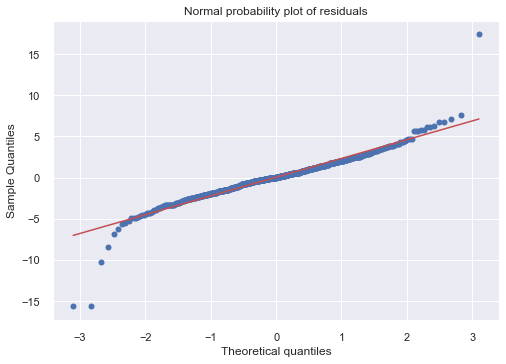

In [98]:
predicted_values = model_adb.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [99]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['ADAboost-Polynomial'], 'accuracy': acc_adb, 'mean_squared_error':mse_adb},index={'15'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


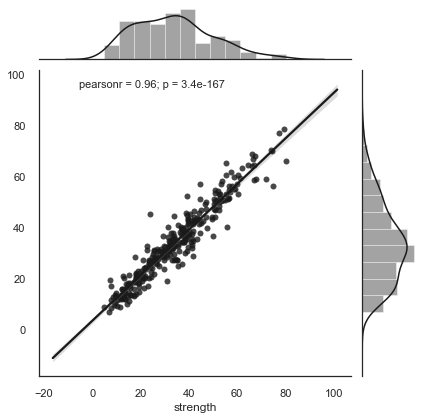

In [100]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_adb ,stat_func=pearsonr,kind="reg", color="k");

In [101]:
num_folds =5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_adb = cross_val_score(model_adb,x_poly, y, cv=kfold)
accuracy_adb=np.mean(abs(results_adb))
print('Average accuracy: ',accuracy_adb)
print('Standard Deviation: ',results_adb.std())

Average accuracy:  0.911375255975663
Standard Deviation:  0.018926909484186943


In [102]:
print(results_adb)

[0.88012554 0.93399935 0.90843726 0.92781669 0.90649744]


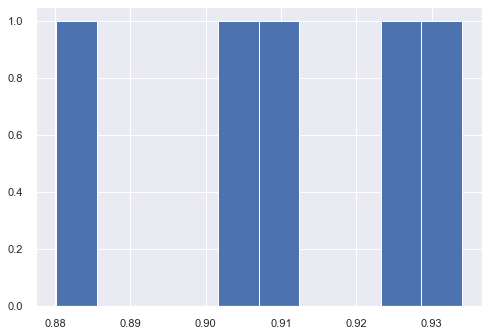

95.0 confidence interval 88.3% and 93.3%


In [103]:
# plot scores
plt.hist(results_adb)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_adb, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_adb, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [104]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['ADA Boost(Bagging)-PolynomialKfold'], 'accuracy': accuracy_adb},index={'16'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# LINEAR REGESSION

In [105]:
lr=LinearRegression()
lr.fit(x_train1,y_train1)
pred_lr=lr.predict(x_test1) 
# performance on train data
print('Performance on training data using LR:',lr.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using LR:',lr.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_lr))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1,pred_lr)))
#Evaluate the model using accuracy
lr_acc=metrics.r2_score(y_test1,pred_lr)
print('Accuracy LR_pipeline: ',lr_acc)
mse_lr= mean_squared_error(y_test1, pred_lr)
mse_lr

Performance on training data using LR: 0.9230484924210022
Performance on testing data using LR: 0.8878784935319086
MSE:  28.77781508447654
RMSE:  5.364495790330769
Accuracy LR_pipeline:  0.8878784935319086


28.77781508447654

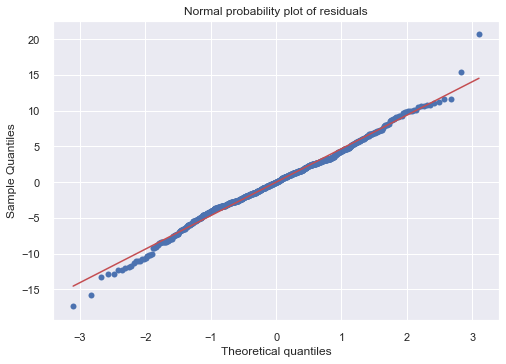

In [106]:
predicted_values = lr.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [107]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['LR with Polynomial'], 'accuracy': lr_acc ,'mean_squared_error':mse_lr},index={'17'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


In [108]:
num_folds =5
seed = 44
kfold_lr = KFold(n_splits=num_folds, random_state=seed)
results_lr = cross_val_score(lr,x_poly, y, cv=kfold_lr)
accuracy_lr=np.mean(abs(results1))
print('Average accuracy: ',accuracy_lr)
print('Standard Deviation: ',results_lr.std())



Average accuracy:  0.8468458346416645
Standard Deviation:  0.012496203117145133


In [109]:
print(results_lr )

[0.85833292 0.88582995 0.87765904 0.89637323 0.88194051]


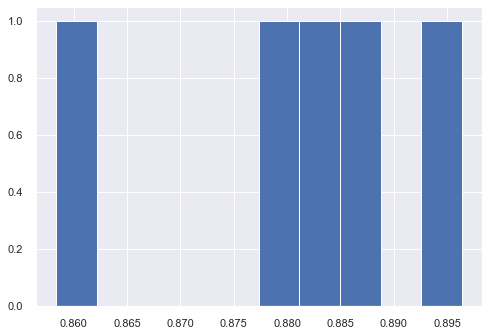

95.0 confidence interval 86.0% and 89.5%


In [110]:
# plot scores
plt.hist(results_lr)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_lr, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_lr, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [111]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['LR -Polynomial Kfold'], 'accuracy': accuracy_lr},index={'18'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# ADABOOST-BASE ESTIMATOR LINEAR REGRESSION

In [112]:
model_adb_lr=AdaBoostRegressor(base_estimator=lr,random_state=50)
model_adb_lr.fit(x_train1, y_train1)
pred_adb_lr=model_adb_lr.predict(x_test1) 
# performance on train data
print('Performance on training data using AdaBoost:',model_adb_lr.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using ADABoost:',model_adb_lr.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_adb_lr))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_adb_lr)))
#Evaluate the model using accuracy
acc_adb_lr=metrics.r2_score(y_test1,pred_adb_lr)
print('Accuracy Ada_pipeline: ',acc_adb_lr) 
mse_adb_lr=mean_squared_error(y_test1, pred_adb_lr)
print(mse_adb_lr)



Performance on training data using AdaBoost: 0.9429442892975197
Performance on testing data using ADABoost: 0.8854687870467213
MSE:  29.396305593773434
RMSE:  5.4218359984209625
Accuracy Ada_pipeline:  0.8854687870467213
29.396305593773434


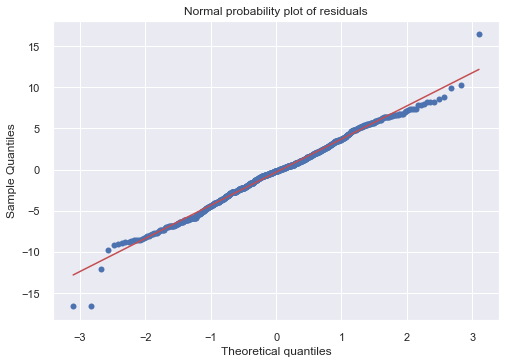

In [113]:
predicted_values = model_adb_lr.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [114]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['ADAboost with LinearRegressor'], 'accuracy': acc_adb_lr, 'mean_squared_error':mse_adb_lr},index={'19'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


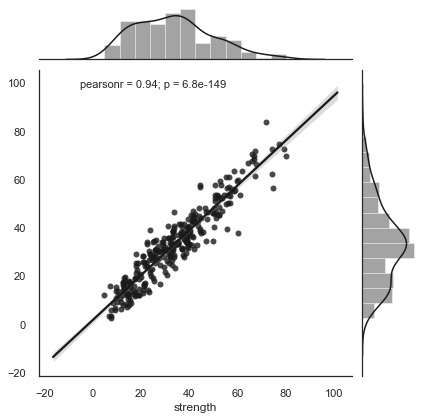

In [115]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_adb_lr ,stat_func=pearsonr,kind="reg", color="k");

In [116]:
num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_adb_lr = cross_val_score(model_adb_lr,x_poly, y, cv=kfold)
accuracy_adb_lr=np.mean(abs(results_adb_lr))
print('Average accuracy: ',accuracy_adb_lr)
print('Standard Deviation: ',results_adb_lr.std())

Average accuracy:  0.8731478226359723
Standard Deviation:  0.03299090629829642


In [117]:
print(results_adb_lr )

[0.81787412 0.90416443 0.85341567 0.88931566 0.90096924]


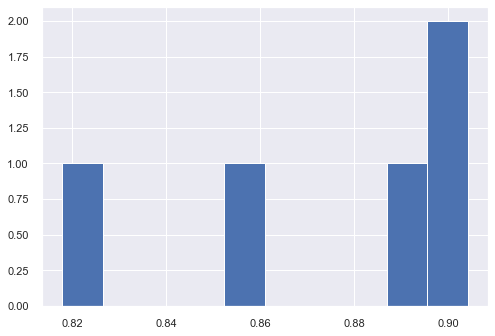

95.0 confidence interval 82.1% and 90.4%


In [118]:
# plot scores
plt.hist(results_adb_lr)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_adb_lr, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_adb_lr, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [119]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['ADA Boost-LR-Kfold'], 'accuracy': accuracy_adb_lr},index={'20'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# LASSO REGRESSION

In [120]:
ls=Lasso()
ls.fit(x_train1,y_train1)
pred_ls=ls.predict(x_test1) 
# performance on train data
print('Performance on training data using LR:',ls.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using LR:',ls.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_ls))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1,pred_ls)))
#Evaluate the model using accuracy
ls_acc=metrics.r2_score(y_test1,pred_ls) 
print('Accuracy LS_pipeline: ',ls_acc)
mse_ls= mean_squared_error(y_test1, pred_ls)
mse_ls

Performance on training data using LR: 0.8838341498875856
Performance on testing data using LR: 0.8853835271411322
MSE:  29.41818894046094
RMSE:  5.42385369829063
Accuracy LS_pipeline:  0.8853835271411321


29.41818894046094

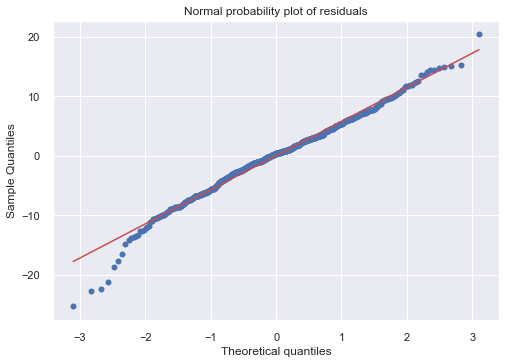

In [121]:
predicted_values = ls.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [122]:
print ("Lasso model:", (ls.coef_))

Lasso model: [-0.00000000e+00 -0.00000000e+00  0.00000000e+00  0.00000000e+00
 -8.31903800e-02  0.00000000e+00  0.00000000e+00 -6.10246403e-06
 -1.37452289e-04  1.53656795e-04  6.68714467e-03 -1.23759758e-05
  2.96375327e-05  5.99454853e-04 -6.64053162e-05  2.93236977e-04
  7.40113578e-03 -3.28189224e-05  3.05647976e-05 -2.47230502e-04
  7.87787371e-04 -4.15892094e-03 -3.69437687e-05  3.87627336e-04
  2.40038636e-05  0.00000000e+00  1.15717123e-03  2.66790821e-05
  1.56367319e-02  3.73866088e-05  6.80982249e-05  1.05595463e-04
 -1.35698579e-05 -6.99904659e-05 -3.43399303e-03  1.52981552e-07
  6.97611292e-07 -1.46814175e-06 -2.58025483e-05  2.70782837e-07
  4.76173382e-08 -1.96721457e-06  2.72129430e-08 -2.16830147e-07
 -1.29415663e-05 -4.19199694e-07  6.53834345e-07 -5.25212979e-06
  6.64279132e-07  6.96784458e-05 -2.00948667e-07  1.10976845e-07
  3.34817813e-06  1.40625552e-04 -5.64523908e-06  3.72946147e-06
 -4.59667967e-05  1.62391789e-08 -1.88867048e-08  9.47022271e-07
 -8.85675263

In [123]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Lasso-Polynomial'], 'accuracy': ls_acc, 'mean_squared_error':mse_ls},index={'21'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


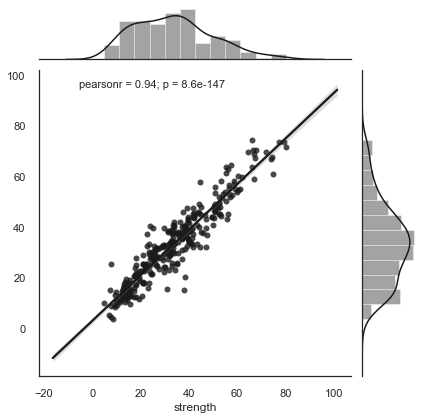

In [124]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_ls ,stat_func=pearsonr,kind="reg", color="k");

In [125]:
#Define a grid of hyperparameter 'params_dt'
params_ls = {
             "alpha":[0.001, 0.01, 0.1, 1, 10, 100, 1000]}
                
# Instantiate 'grid_ls'
grid_ls = GridSearchCV(estimator=ls, 
                       param_grid=params_ls,
                       cv= 7,)

# Fit 'grid_dt' to the training set
grid_ls.fit(x_train1, y_train1)
# Extract best hyperparameters from 'grid_dt'
best_hyperparams = grid_ls.best_params_ 
print('Best hyerparameters:\n', best_hyperparams)
print("accuracy :",grid_ls.best_score_) 

Best hyerparameters:
 {'alpha': 100}
accuracy : 0.8382716772098003


In [126]:
# GRIDSEARCH CV RESULTS
ls1=Lasso(alpha=100)
ls1.fit(x_train1,y_train1)


pred_ls1=ls1.predict(x_test1) 
# performance on train data
print('Performance on training data using LR:',ls1.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using LR:',ls1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_ls1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1,pred_ls1)))
#Evaluate the model using accuracy
ls1_acc=metrics.r2_score(y_test1,pred_ls1)
print('Accuracy LR_pipeline: ',ls1_acc)
mse_ls1= mean_squared_error(y_test1, pred_ls1)
mse_ls1

Performance on training data using LR: 0.8834535344662119
Performance on testing data using LR: 0.885462606506374
MSE:  29.39789193035453
RMSE:  5.421982287904907
Accuracy LR_pipeline:  0.885462606506374


29.39789193035453

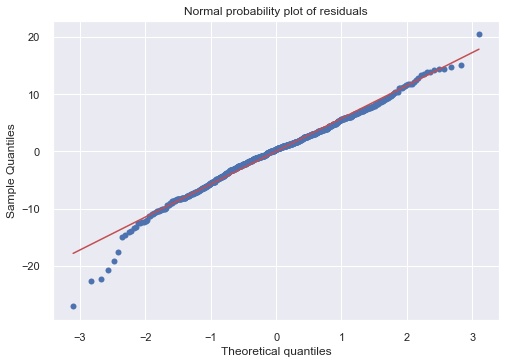

In [127]:
predicted_values = ls1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [128]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Lasso-Polynomial-Gridsearch'], 'accuracy': ls1_acc, 'mean_squared_error':mse_ls1},index={'22'})
results = pd.concat([results, tempResultsDf])
results 

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


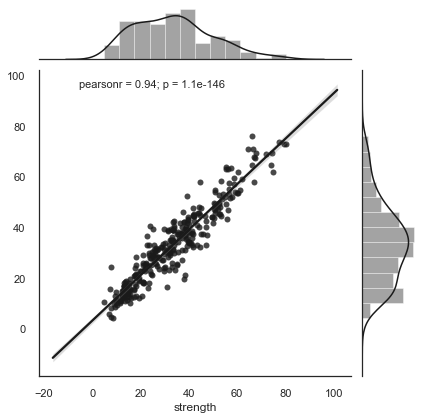

In [129]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_ls1 ,stat_func=pearsonr,kind="reg", color="k");

In [130]:
num_folds =5
seed = 44
kfold_ls1 = KFold(n_splits=num_folds, random_state=seed)
results_ls1 = cross_val_score(ls1,x_poly, y, cv=kfold_ls1)
accuracy_ls1=np.mean(abs(results1))
print('Average accuracy: ',accuracy_ls1)
print('Standard Deviation: ',results_ls1.std())



Average accuracy:  0.8468458346416645
Standard Deviation:  0.02621456393999682


In [131]:
print(results_ls1)

[0.82012043 0.89948644 0.85132742 0.87427193 0.86553425]


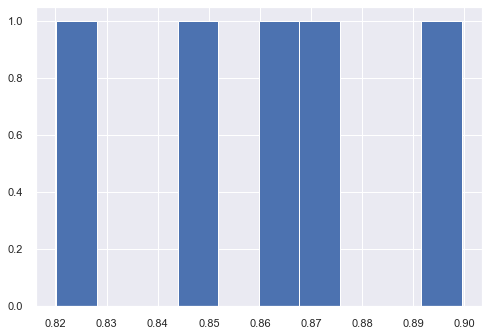

95.0 confidence interval 82.3% and 89.7%


In [132]:
# plot scores
plt.hist(results_ls1)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_ls1, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_ls1, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [133]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Lasso-Polynomial-Kfold'], 'accuracy': accuracy_ls1,},index={'23'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# RIDGE REGRESSOR

In [134]:
ridg=Ridge()
ridg.fit(x_train1,y_train1)
pred_rid=ridg.predict(x_test1) 
# performance on train data
print('Performance on training data using Ridge:',ridg.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using Ridge:',ridg.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_rid)) 
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_rid)))
#Evaluate the model using accuracy
ridge_acc=metrics.r2_score(y_test1,pred_rid)
print('Accuracy Ridge_pipeline: ',ridge_acc)  
mse_rid= mean_squared_error(y_test1, pred_rid)
mse_rid

Performance on training data using Ridge: 0.9202169129542094
Performance on testing data using Ridge: 0.8938888081543593
MSE:  27.235169714708515
RMSE:  5.218732577428021
Accuracy Ridge_pipeline:  0.8938888081543594


27.235169714708515

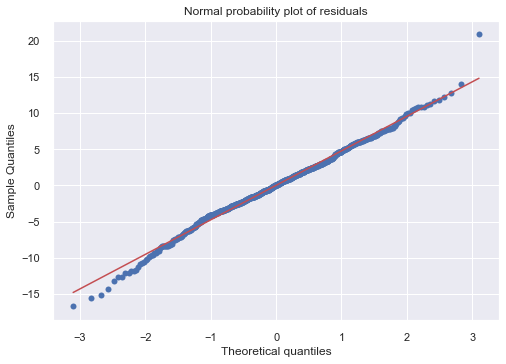

In [135]:
predicted_values = ridg.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [136]:
print(ridg.intercept_) 
print(ridg.coef_)

1252.6384046685916
[ 1.03010074e+01  1.62119210e+00 -7.33018803e-02  3.71857734e-01
 -8.65383675e+00  2.07957838e+00  1.23065157e+00 -1.02243063e-02
 -1.10894841e-02  4.81065894e-03 -1.57411570e-01 -8.96400651e-03
 -6.41893345e-03 -5.69111621e-03 -7.97415002e-03  4.12074544e-02
 -6.52676242e-02 -1.06692122e-02  5.65388729e-03 -5.42502622e-04
 -7.07097300e-02  4.22363849e-01  4.06657738e-02 -2.62588994e-02
  3.83592472e-02  2.24145155e+00  1.25621206e-01 -2.25385791e-01
  1.83931292e-01  7.17819086e-03 -2.19462347e-03 -1.21116744e-02
  3.78549547e-03  1.12790366e-02 -3.59051604e-02  1.91775953e-06
  5.15478660e-06  9.23109806e-06  2.34124973e-05  4.11038536e-06
  3.13746943e-06  1.02736663e-08  4.72964152e-06  3.10674374e-06
  3.32284076e-05  4.17381876e-06  3.54967719e-06  1.19268240e-06
 -1.88625822e-05  1.23589500e-04 -6.85110082e-06  2.52502515e-06
 -5.94492345e-06  1.61852690e-04  5.25996394e-05  9.10908942e-05
 -1.59731515e-04  2.12585229e-06  4.08911241e-06  6.29819627e-06
 -4.55

In [137]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Ridge-Polynomial'], 'accuracy': ridge_acc, 'mean_squared_error':mse_rid},index={'24'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


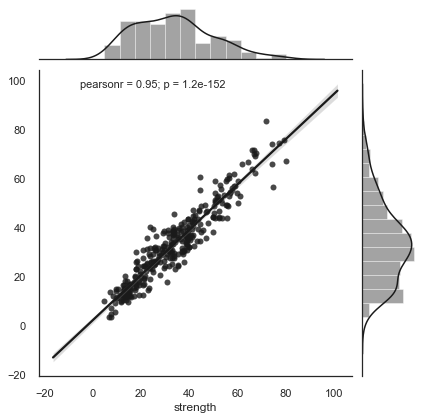

In [138]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_rid ,stat_func=pearsonr,kind="reg", color="k");

In [139]:
# Define a grid of hyperparameter 'params_dt'
params_ridge = {
             "alpha":[10, 100, 1000]}
                
# Instantiate 'grid_ls'
grid_rid = GridSearchCV(estimator=ridg, 
                       param_grid=params_ridge,
                       cv= 7,)

# Fit 'grid_dt' to the training set
grid_rid.fit(x_train1, y_train1)
# Extract best hyperparameters from 'grid_dt'
best_hyperparams = grid_rid.best_params_ 
print('Best hyerparameters:\n', best_hyperparams)
print("accuracy :",grid_rid.best_score_) 




Best hyerparameters:
 {'alpha': 100}
accuracy : 0.8538964627829561


In [140]:
# APPLYING GRIDSEARCH RESULTS
ridg1=Ridge(alpha=100)
ridg1.fit(x_train1, y_train1)

pred_rid1=ridg1.predict(x_test1) 
# performance on train data
print('Performance on training data using Ridge:',ridg1.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using Ridge:',ridg1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_rid1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_rid1)))
#Evaluate the model using accuracy
ridge_acc1=metrics.r2_score(y_test1,pred_rid1)
print('Accuracy Ridge_pipeline: ',ridge_acc1)
mse_rid1= mean_squared_error(y_test1, pred_rid1)
mse_rid1

Performance on training data using Ridge: 0.917284781298177
Performance on testing data using Ridge: 0.8972583752635046
MSE:  26.37031530598446
RMSE:  5.135203531115827
Accuracy Ridge_pipeline:  0.8972583752635046


26.37031530598446

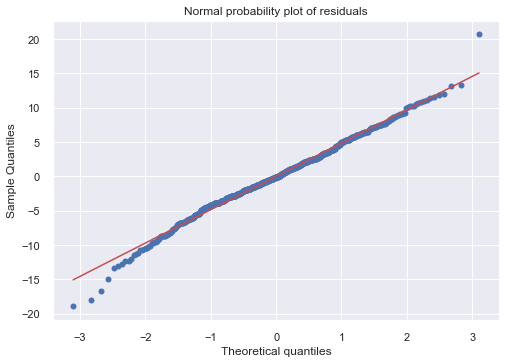

In [141]:
predicted_values = ridg1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [142]:
ridg1.intercept_, ridg1.coef_

(-121.0287985577142,
 array([ 1.98860013e-01, -1.07930963e-02,  7.83588013e-03,  8.68383468e-03,
        -1.48023358e-01, -5.88947889e-04,  1.36867520e-02, -5.56347807e-03,
        -6.39248452e-03,  3.52219535e-02, -5.67158659e-02, -3.72534895e-03,
         1.84426801e-03, -4.10713031e-03, -7.42736865e-03,  4.89641496e-02,
        -2.27280166e-02, -1.07121954e-02,  6.24226160e-03,  1.82072314e-03,
        -7.75680402e-02,  3.49836009e-01,  2.04510889e-02, -7.40751902e-03,
         3.82782443e-02,  4.67040198e-01,  8.78491297e-02, -1.70884766e-01,
         2.06526344e-01,  1.53702973e-03, -6.62501420e-03, -1.21679092e-02,
         5.60994672e-03,  1.29258432e-02, -3.03850368e-02,  1.31671379e-06,
         4.13201840e-06,  2.85848071e-06,  1.54467936e-06,  2.48030089e-06,
         1.52042897e-06, -3.18092702e-07,  3.96958327e-06, -4.90278209e-06,
         4.09200366e-06,  2.75641665e-06,  2.21126105e-06,  5.59345378e-07,
        -3.90622314e-05,  2.04247197e-05, -1.46612850e-05, -1.21435

In [143]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['RidgePolynomial with Gridsearch'], 'accuracy': ridge_acc1, 'mean_squared_error':mse_rid1},index={'25'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


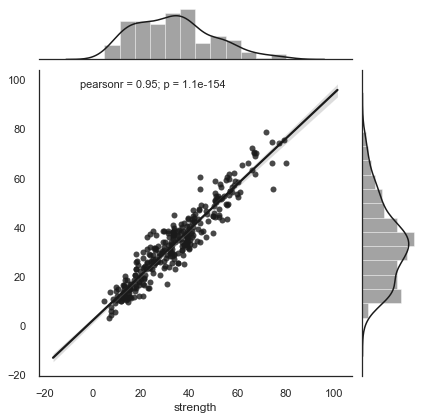

In [144]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_rid1 ,stat_func=pearsonr,kind="reg", color="k");

In [145]:
num_folds =5
seed = 44
kfold_ridge = KFold(n_splits=num_folds, random_state=seed)
results_rid = cross_val_score(ridg1,x_poly, y, cv=kfold_ridge)
accuracy_rid=np.mean(abs(results1))
print('Average accuracy: ',accuracy_rid)
print('Standard Deviation: ',results_rid.std())

Average accuracy:  0.8468458346416645
Standard Deviation:  0.015319701859977681


In [146]:
print(results_rid)

[0.85079895 0.88585994 0.88515992 0.89572826 0.88355922]


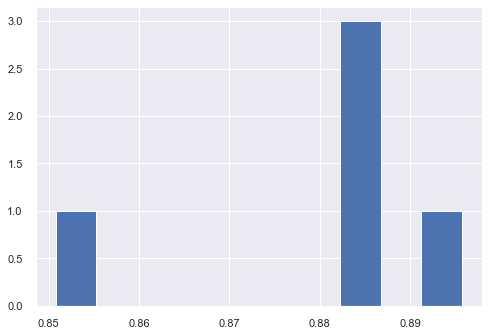

95.0 confidence interval 85.4% and 89.5%


In [147]:
# plot scores
plt.hist(results_rid)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_rid, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_rid, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [148]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Ridge-Polynomial-Kfold'], 'accuracy': accuracy_rid,},index={'26'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# ADABOOST WITH BASE ESTIMATOR -RIDGE

In [149]:
model_adb_rid=AdaBoostRegressor(base_estimator=ridg1,random_state=20)
model_adb_rid.fit(x_train1, y_train1)
pred_adb_rid=model_adb_rid.predict(x_test1) 
# performance on train data
print('Performance on training data using AdaBoost:',model_adb_rid.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using ADABoost:',model_adb_rid.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_adb_rid))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_adb_rid)))
#Evaluate the model using accuracy
acc_adb_rid=metrics.r2_score(y_test1,pred_adb_rid)
print('Accuracy Ada_pipeline: ',acc_adb_rid)
mse_adb_rid=mean_squared_error(y_test1, pred_adb_rid)
print(mse_adb_rid)



Performance on training data using AdaBoost: 0.9373096236509753
Performance on testing data using ADABoost: 0.8931663718141102
MSE:  27.42059479563107
RMSE:  5.236467778534599
Accuracy Ada_pipeline:  0.8931663718141101
27.42059479563107


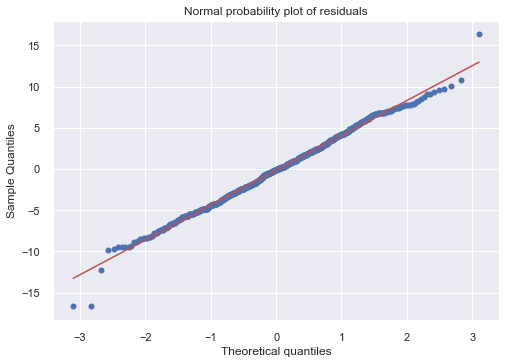

In [150]:
predicted_values = model_adb_rid.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [151]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['ADAboost with ridge'], 'accuracy': acc_adb_rid, 'mean_squared_error':mse_adb_rid},index={'27'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


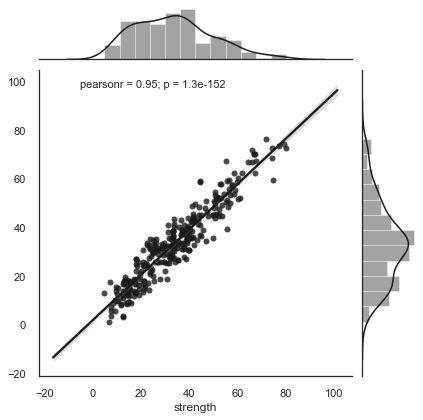

In [152]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=pred_adb_rid ,stat_func=pearsonr,kind="reg", color="k");

In [153]:
num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_adb_rid = cross_val_score(model_adb_rid,x_poly, y, cv=kfold)
accuracy_adb_rid=np.mean(abs(results_adb_rid))
print('Average accuracy: ',accuracy_adb_rid)
print('Standard Deviation: ',results_adb_rid.std())

Average accuracy:  0.8792031886269177
Standard Deviation:  0.023485872565960825


In [154]:
print(results_adb_rid)

[0.83725251 0.90472617 0.8755764  0.88109395 0.8973669 ]


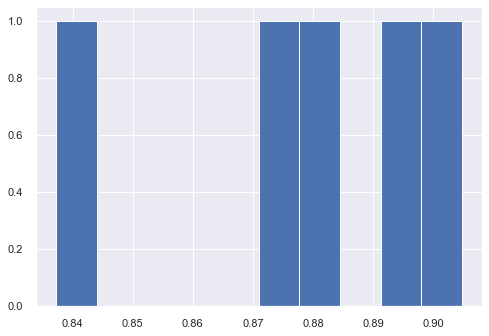

95.0 confidence interval 84.1% and 90.4%


In [155]:
# plot scores
plt.hist(results_adb_rid)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_adb_rid, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_adb_rid, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [156]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Adaboost-Ridge-Polynomial-Kfold'], 'accuracy': accuracy_adb_rid,},index={'28'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# SUPPORT VECTOR REGRESSOR

In [157]:
model_svc = SVR()
model_svc.fit(x_train1, y_train1)

y_pred_svc=model_svc.predict(x_test1)
# performance on train data
print('Performance on training data using DT:',model_svc.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',model_svc.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred_svc))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred_svc)))
#Evaluate the model using accuracy
acc_svc=metrics.r2_score(y_test1,y_pred_svc)
print('Accuracy SVR_pipeline: ',acc_svc)
mse_svc=mean_squared_error(y_test1, y_pred_svc)
mse_svc

Performance on training data using DT: 0.22568316138449507
Performance on testing data using DT: 0.24151708651843126
MSE:  194.67702242405633
RMSE:  13.952670798956605
Accuracy SVR_pipeline:  0.2415170865184313


194.67702242405633

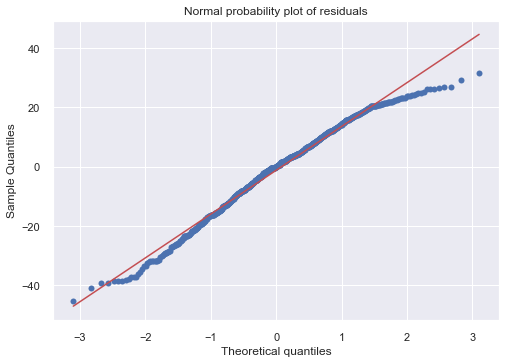

In [158]:
predicted_values = model_svc.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [159]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['SVC-Polynomial'], 'accuracy': acc_svc, 'mean_squared_error':mse_svc},index= {'29'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


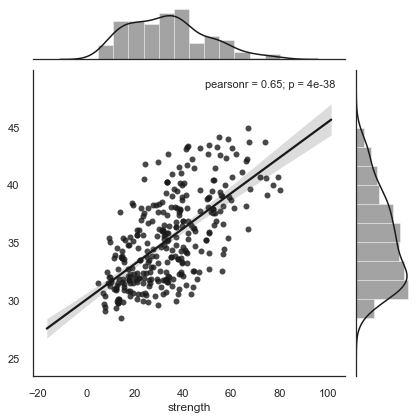

In [160]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=y_pred_svc ,stat_func=pearsonr,kind="reg", color="k");

In [161]:
#GRIDSEARCH CV
parameters = {'C': list(range(70,100,3)), 'gamma':['auto']}
svrgs = GridSearchCV(SVR(), param_grid = parameters, cv = 10)
svrgs.fit(x_train1, y_train1)

GridSearchCV(cv=10, error_score=nan,
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='scale', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [70, 73, 76, 79, 82, 85, 88, 91, 94, 97],
                         'gamma': ['auto']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [162]:
# Extract best hyperparameters from 'grid_dt'
best_hyperparams = svrgs.best_params_ 
print('Best hyerparameters:\n', best_hyperparams)

Best hyerparameters:
 {'C': 70, 'gamma': 'auto'}


In [163]:
# Applying Gridsearch results
model_svc1 = SVR(C=70,gamma='auto')
model_svc1.fit(x_train1, y_train1)

y_pred_svc1=model_svc1.predict(x_test1)
# performance on train data
print('Performance on training data using DT:',model_svc1.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',model_svc1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred_svc1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred_svc1)))
#Evaluate the model using accuracy
acc_svc1=metrics.r2_score(y_test1,y_pred_svc1)
print('Accuracy SVR_pipeline: ',acc_svc1)
mse_svc1=mean_squared_error(y_test1, y_pred_svc1)
mse_svc1

Performance on training data using DT: 0.9928784866846918
Performance on testing data using DT: 0.09522767964212164
MSE:  232.2245869593427
RMSE:  15.238916856500751
Accuracy SVR_pipeline:  0.09522767964212164


232.2245869593427

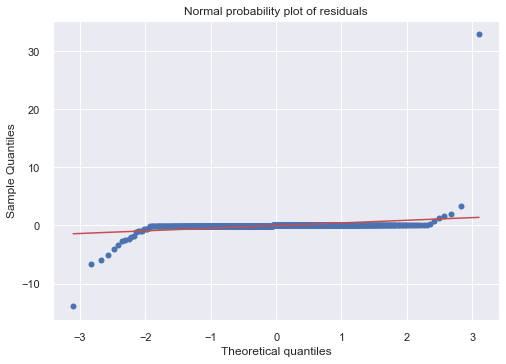

In [164]:
predicted_values = model_svc1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [165]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['SVR-Polynomial Gridsearch'], 'accuracy': acc_svc1, 'mean_squared_error':mse_svc1},index={'30'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


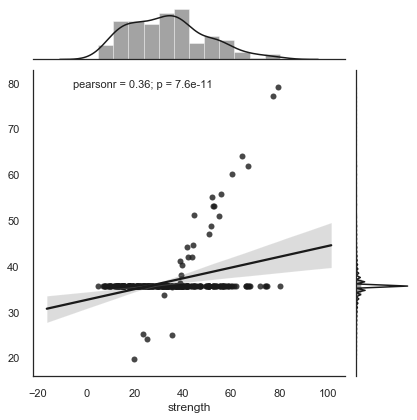

In [166]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=y_pred_svc1 ,stat_func=pearsonr,kind="reg", color="k");

In [167]:
num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_svc1 = cross_val_score(model_svc1,x_poly, y, cv=kfold)
accuracy_svc1=np.mean(abs(results_svc1))
print('Average accuracy: ',accuracy_svc1)
print('Standard Deviation: ',results_svc1.std())

Average accuracy:  0.12637857051270357
Standard Deviation:  0.02279410445322477


In [168]:
print(results_svc1)

[0.14649538 0.1210334  0.15877738 0.10388673 0.10169996]


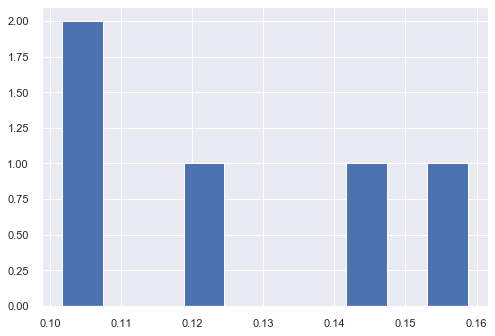

95.0 confidence interval 10.2% and 15.8%


In [169]:
# plot scores
plt.hist(results_svc1)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_svc1, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_svc1, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [170]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['SVR-Gridsearch Kfold'], 'accuracy': accuracy_svc1},index={'31'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# K NEIGHBORS REGRSSOR

In [171]:
knn= KNeighborsRegressor(n_neighbors= 3)# taking n_neighbours randomly as 3

knn.fit(x_train1, y_train1)     
y_pred_knn=knn.predict(x_test1)
# performance on train data
print('Performance on training data using DT:',knn.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',knn.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred_knn))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred_knn)))
#Evaluate the model using accuracy
acc_knn=metrics.r2_score(y_test1,y_pred_knn)
print('Accuracy KNN_pipeline: ',acc_knn)
mse_knn=mean_squared_error(y_test1, y_pred_knn)
mse_knn

Performance on training data using DT: 0.8450928596082095
Performance on testing data using DT: 0.5425761154041793
MSE:  117.40530769507372
RMSE:  10.835372983662063
Accuracy KNN_pipeline:  0.5425761154041793


117.40530769507372

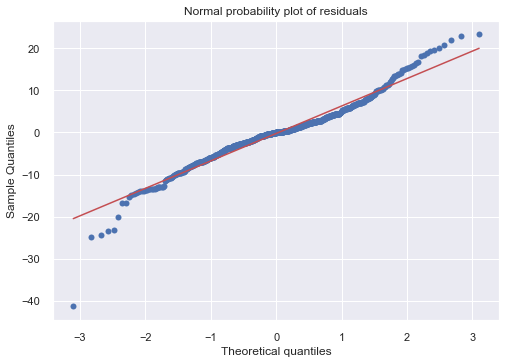

In [172]:
predicted_values = knn.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [173]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['KNN-Polynomial'], 'accuracy': acc_knn, 'mean_squared_error':mse_knn},index={'32'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


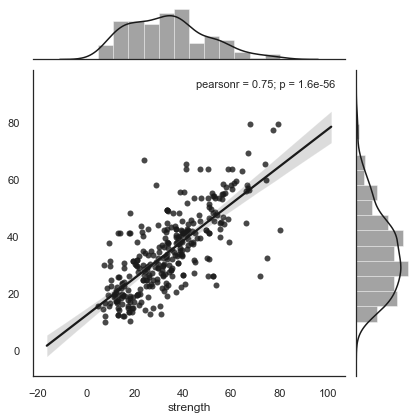

In [174]:
from scipy.stats import pearsonr
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=y_pred_knn ,stat_func=pearsonr,kind="reg", color="k");

In [175]:
# Finding Optimal K Nearest Neighbors
scores =[]
for k in range(1,11):
    NNH = KNeighborsRegressor(n_neighbors = k, weights = 'uniform'  )
    NNH.fit(x_train1, y_train1)
    scores.append(NNH.score(x_test1, y_test1))

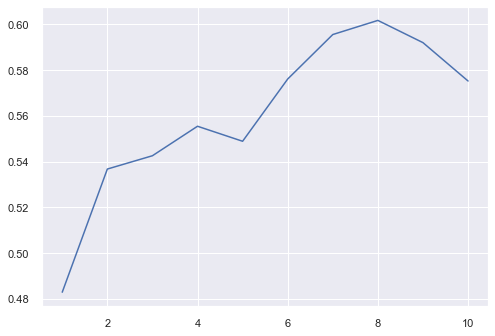

In [176]:
plt.plot(range(1,11),scores)

In [177]:
# Define a grid of hyperparameter 'params_dt'
params_knn = {'n_neighbors':[1,3,9,11],'metric':["euclidean",'cityblock','minkowski'],'weights':["uniform","distance"]}
                
# Instantiate 'grid_dt' 
grid_knn = GridSearchCV(estimator=knn, 
                       param_grid=params_knn,
                       cv= 7,)

# Fit 'grid_dt' to the training set
grid_knn.fit(x_train1, y_train1)

# Extract best hyperparameters from 'grid_dt'
best_hyperparams_knn = grid_knn.best_params_ 
print('Best hyerparameters:\n', best_hyperparams_knn)

Best hyerparameters:
 {'metric': 'cityblock', 'n_neighbors': 9, 'weights': 'distance'}


In [178]:
# Applying Gridsearch values
knn1= KNeighborsRegressor(n_neighbors= 9,metric='cityblock',weights='distance')# taking n_neighbours randomly as 3

knn1.fit(x_train1, y_train1)     
y_pred_knn1=knn1.predict(x_test1)
# performance on train data 
print('Performance on training data using DT:',knn1.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',knn1.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred_knn1))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred_knn1)))
#Evaluate the model using accuracy
acc_knn1=metrics.r2_score(y_test1,y_pred_knn1)
print('Accuracy KNN_pipeline: ',acc_knn1)
mse_knn1=mean_squared_error(y_test1, y_pred_knn1)
mse_knn1

Performance on training data using DT: 0.9954698895855629
Performance on testing data using DT: 0.6922820075854794
MSE:  78.98084643013243
RMSE:  8.887116879513425
Accuracy KNN_pipeline:  0.6922820075854794


78.98084643013243

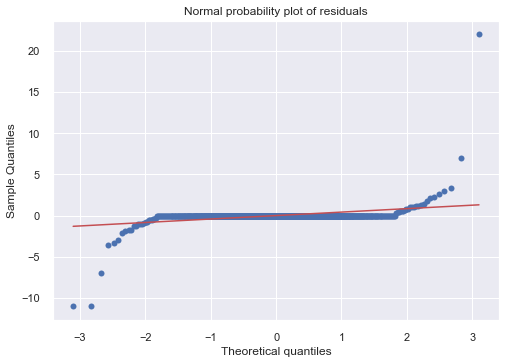

In [179]:
predicted_values = knn1.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [180]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['KNN-GRIDSEARCH'], 'accuracy': acc_knn1, 'mean_squared_error':mse_knn1},index={'33'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


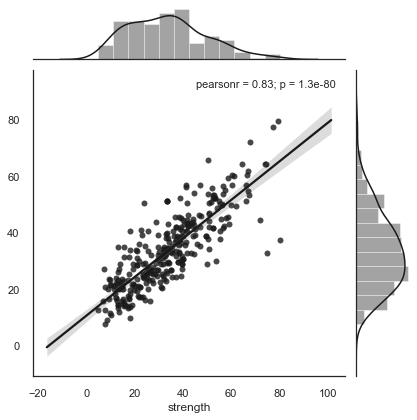

In [181]:
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=y_pred_knn1 ,stat_func=pearsonr,kind="reg", color="k");

In [182]:
num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_knn = cross_val_score(knn1,x_poly, y, cv=kfold)
accuracy_knn=np.mean(abs(results_knn))
print('Average accuracy: ',accuracy_knn)
print('Standard Deviation: ',results_knn.std())

Average accuracy:  0.7480952787511048
Standard Deviation:  0.031777842074932026


In [183]:
print(results_knn)

[0.70479122 0.78417785 0.73637854 0.78545124 0.72967754]


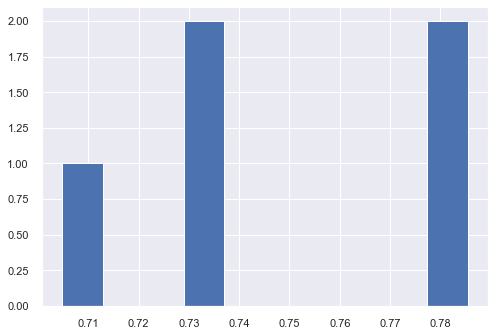

95.0 confidence interval 70.7% and 78.5%


In [184]:
# plot scores
plt.hist(results_knn)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_knn, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_knn, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [185]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['KNN-Gridsearch Kfold'], 'accuracy': accuracy_knn,},index={'34'})
results = pd.concat([results, tempResultsDf]) 
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# VOTING REGRESSOR

In [186]:
#Multiple model Ensemble
from sklearn import svm
ls1=Lasso(alpha=100)
ridg1=Ridge(alpha=100)
knn1=KNeighborsRegressor(n_neighbors=9)
model_svc1=SVR(C=76)

In [187]:
evc=VotingRegressor(estimators=[('LS',ls1),('RD',ridg1),('KNN',knn1)])
evc.fit(x_train1, y_train1)
y_pred_evc=evc.predict(x_test1)
# performance on train data
print('Performance on training data using DT:',evc.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using DT:',evc.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, y_pred_evc))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, y_pred_evc)))
#Evaluate the model using accuracy
acc_evc=metrics.r2_score(y_test1,y_pred_evc)
print('Accuracy KNN_pipeline: ',acc_evc)
mse_evc=mean_squared_error(y_test1, y_pred_evc)
mse_evc


Performance on training data using DT: 0.8916653362014038
Performance on testing data using DT: 0.8839064323765705
MSE:  29.797309426225155
RMSE:  5.458691182529486
Accuracy KNN_pipeline:  0.8839064323765706


29.797309426225155

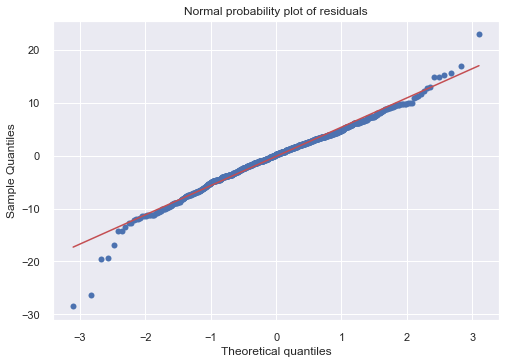

In [188]:
predicted_values = evc.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [189]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Voting Regressor'], 'accuracy': acc_evc ,'mean_squared_error':mse_evc} ,index={'35'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


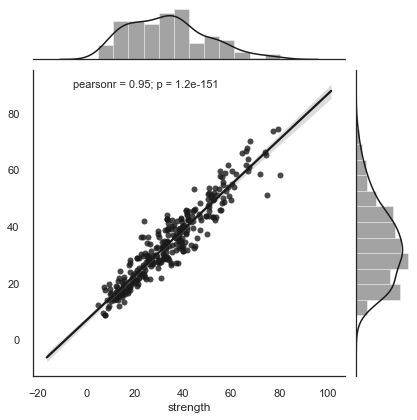

In [190]:
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
    sns.jointplot(x=y_test1, y=y_pred_evc ,stat_func=pearsonr,kind="reg", color="k");

In [191]:
num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_evc = cross_val_score(evc,x_poly, y, cv=kfold)
accuracy_evc=np.mean(abs(results_evc))
print('Average accuracy: ',accuracy_evc)
print('Standard Deviation: ',results_evc.std())

Average accuracy:  0.8560029255653874
Standard Deviation:  0.020485009455554294


In [192]:
print(results_evc)

[0.82500968 0.88698104 0.84971128 0.86685308 0.85145955]


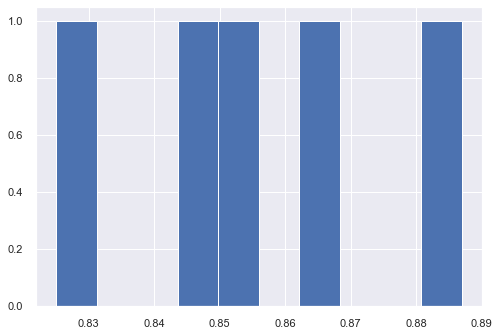

95.0 confidence interval 82.7% and 88.5%


In [193]:
# plot scores
plt.hist(results_evc)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_evc, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_evc, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [194]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['VotingRegressor- KFOLD'], 'accuracy': accuracy_evc} ,index={'36'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# EXTRA TREES REGRESSOR

In [195]:
from sklearn.ensemble import ExtraTreesRegressor
clf = ExtraTreesRegressor(random_state=15)
clf.fit(x_train1, y_train1)
pred_clf=clf.predict(x_test1) 
# performance on train data
print('Performance on training data using AdaBoost:',clf.score(x_train1,y_train1))
# performance on test data
print('Performance on testing data using ADABoost:',clf.score(x_test1,y_test1))
print('MSE: ',metrics.mean_squared_error(y_test1, pred_clf))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test1, pred_clf)))
#Evaluate the model using accuracy
acc_clf=metrics.r2_score(y_test1,pred_clf)
print('Accuracy ExtraTrees_pipeline: ',acc_clf)
mse_clf=mean_squared_error(y_test1, pred_clf)
print(mse_clf)

Performance on training data using AdaBoost: 0.9954698895855629
Performance on testing data using ADABoost: 0.922306832786012
MSE:  19.941219752053208
RMSE:  4.465559287710018
Accuracy ExtraTrees_pipeline:  0.9223068327860119
19.941219752053208


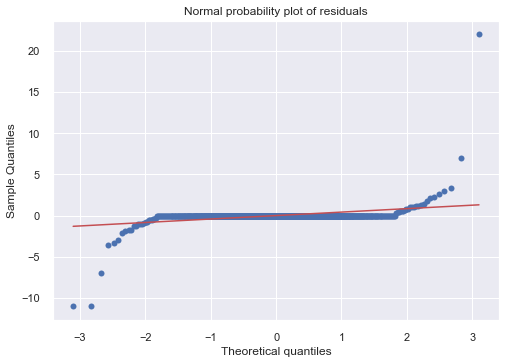

In [196]:
predicted_values = clf.predict(x_train1)
residuals = predicted_values - y_train1

stats.probplot(residuals, plot=plt)
plt.ylabel('Sample Quantiles')
plt.title('Normal probability plot of residuals')
plt.show()

In [197]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['EXTRA TREES-Polynomial'], 'accuracy': acc_clf ,'mean_squared_error':mse_clf} ,index={'37'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results
       

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


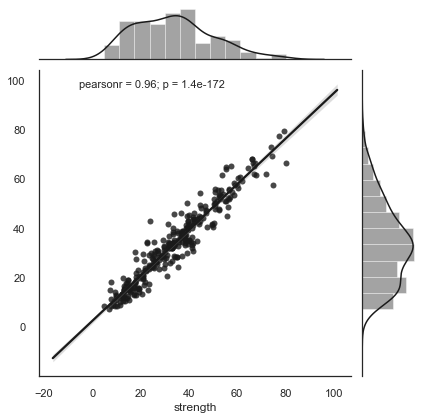

In [198]:
sns.set(style="darkgrid", color_codes=True)   
with sns.axes_style("white"):
     sns.jointplot(x=y_test1, y=pred_clf ,stat_func=pearsonr,kind="reg", color="k");

In [199]:
num_folds = 5
seed = 44
kfold = KFold(n_splits=num_folds, random_state=seed)
results_clf = cross_val_score(clf,x_poly, y, cv=kfold)
accuracy_clf=np.mean(abs(results_clf))
print('Average accuracy: ',accuracy_clf)
print('Standard Deviation: ',results_clf.std())

Average accuracy:  0.9201730506147736
Standard Deviation:  0.01928583551672609


In [200]:
print(results_clf)

[0.89033348 0.94598052 0.90886718 0.93321986 0.92246422]


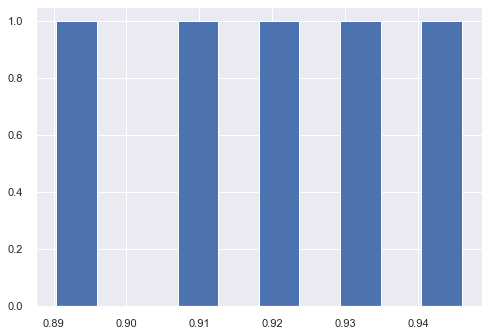

95.0 confidence interval 89.2% and 94.5%


In [201]:
# plot scores
plt.hist(results_clf)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(results_clf, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(results_clf, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [202]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['ExtraTrees- KFOLD'], 'accuracy': accuracy_clf} ,index={'38'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


In [203]:
values = df1.values
# Number of bootstrap samples to create
n_iterations = 500        
# size of a bootstrap sample
n_size = int(len(x_poly) * .5)    

# run bootstrap
# empty list that will hold the scores for each bootstrap iteration
stats = list()   
for i in range(n_iterations):
    # prepare train and test sets
    train = resample(values, n_samples=n_size)  # Sampling with replacement 
    test = np.array([x for x in values if x.tolist() not in train.tolist()])  # picking rest of the data not considered in sample
    
    
     # fit model
    gbmTree = GradientBoostingRegressor()
    # fit against independent variables and corresponding target values
    gbmTree.fit(train[:,:-1], train[:,-1]) 
    # Take the target column for all rows in test set

    y_test = test[:,-1]    
    # evaluate model
    # predict based on independent variables in the test data
    score = gbmTree.score(test[:, :-1] , y_test)
    predictions = gbmTree.predict(test[:, :-1])  

    stats.append(score)
    print(score) 

0.84554375518372
0.8462303779293479
0.8715635737310161
0.8807310223290812
0.8397873228183771
0.8775210112596573
0.8719369314471076
0.864824079332862
0.8811602698623107
0.8727032425234175
0.8678646739802284
0.8832057453602166
0.8550886041390728
0.8682362484677244
0.8772245352917487
0.8738087036579879
0.8708823177846629
0.8678414562844093
0.8643053033584878
0.8730227645087285
0.8861723980279949
0.8571948962532002
0.8819364882328392
0.8832680924221269
0.8558167961231851
0.8447145928393565
0.8672753918605638
0.8727819855508547
0.8559988305213965
0.8801769700767774
0.8913105384452764
0.8787196291083753
0.8665929709914149
0.8655428330613956
0.873984742641165
0.8826195458262912
0.8786025437330938
0.8694843430529462
0.857451567375579
0.8697816650967554
0.8800386948442376
0.891178443522257
0.8754831371935483
0.868539813912201
0.8649298126116672
0.8749458502895857
0.8922330929859132
0.8812437019363869
0.8711608230317808
0.8756622510031806
0.8621281356953907
0.8730877055291094
0.877938246592075
0

0.8604483902728378
0.861685459711935
0.8520064522008578
0.8613624811077103
0.8792831976574137
0.845326724711125
0.8539606674933495
0.8646597538995612
0.8587382507749897
0.873859568522362
0.8461151426037286
0.8698754895434984
0.8629695194671222
0.8577812991456227
0.8703974813157045
0.8689873925519652
0.8791836216947226
0.8581611182231091
0.8657521360309556
0.8754944476136421
0.8640130134990545
0.8641941063064212
0.8818269613452631
0.8690270812671169
0.8663775904186641
0.8858822432938179
0.8666750167660178
0.817266411983845
0.8533327615059615
0.8478814407247617
0.8835152051942436
0.8512967223377088
0.877595256153002
0.8883515988097741
0.8659833872470779
0.8778039411187193
0.8725887932223231
0.8743605403622924
0.8541182506663921
0.8639931713212152
0.8403568085444261
0.8812030580395228
0.8780412745140379
0.8809823768316537
0.8460009926816728
0.8637258294431578
0.8842062563195952
0.8547909967469555
0.8729639792289147
0.8625695997996005
0.8656415472371954
0.8558592786235977
0.877358961724403

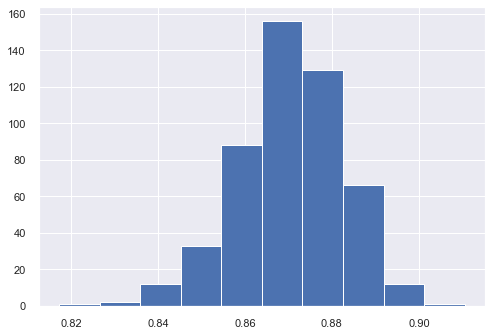

95.0 confidence interval 84.5% and 89.2%


In [204]:
# plot scores

from matplotlib import pyplot
pyplot.hist(stats)
pyplot.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [205]:
values = df1.values
# Number of bootstrap samples to create
n_iterations = 500        
# size of a bootstrap sample
n_size = int(len(x_poly) * .5)    

# run bootstrap
# empty list that will hold the scores for each bootstrap iteration
stats = list()   
for i in range(n_iterations):
    # prepare train and test sets
    train = resample(values, n_samples=n_size)  # Sampling with replacement 
    test = np.array([x for x in values if x.tolist() not in train.tolist()])  # picking rest of the data not considered in sample
    
    
     # fit model
    AD = AdaBoostRegressor()
    # fit against independent variables and corresponding target values
    AD.fit(train[:,:-1], train[:,-1]) 
    # Take the target column for all rows in test set

    y_test = test[:,-1]    
    # evaluate model
    # predict based on independent variables in the test data
    score = AD.score(test[:, :-1] , y_test)
    predictions = AD.predict(test[:, :-1])  

    stats.append(score) 
    print(score)
    

0.7899243440661334
0.7618750615312091
0.7423407209994349
0.7816616591288305
0.7637898452344605
0.7400348668942618
0.733871840957597
0.7464918702443688
0.7582893467478957
0.751787679521318
0.7306698368040729
0.7583095993343992
0.7923307042951558
0.7588188406975747
0.7557530574360514
0.7652345296303558
0.7745741389741235
0.7517311022044041
0.7460062888108816
0.7491637175792376
0.7362364082889519
0.7639361559479461
0.7866220435149165
0.7449506984249745
0.7774226315651844
0.7410123109521547
0.7732188919871954
0.7594003017250522
0.7462913208018724
0.765231925568436
0.7915849755836264
0.754026884106753
0.7906624421676662
0.7796322944843368
0.7435968893787586
0.7719706680162732
0.7714221099245651
0.7704415601883201
0.7415556658804665
0.7386293442455202
0.7724817290964416
0.7253934928753261
0.7668983640392302
0.7593209246651054
0.7517662788000877
0.7766371586826051
0.7715282420244184
0.7765024722268723
0.7707107992928385
0.7558805169007385
0.761649603510009
0.7530481546937736
0.766662994046888

0.7409728211930151
0.7739380396982297
0.7528085440307855
0.7495056145318058
0.7552475410883456
0.7609387907573348
0.7495668551541752
0.753579642571749
0.7455696688299356
0.7743043412796302
0.789993260161852
0.7635034189110865
0.7508629571126789
0.7398933431130792
0.7662014892543085
0.7633228517308555
0.7625406457665291
0.7583811051515083
0.7959760955684102
0.763948061837704
0.7669217567816051
0.7672994114737309
0.7550322604643127
0.7627408189605677
0.7431870544775949
0.7294169779712065
0.755610699277589
0.7785679741008076
0.7821060331575452
0.7537694691002067
0.7617417166796411
0.7909473759691569
0.7669344163886149
0.7350308196934427
0.7332323267308896
0.7447979358044099
0.7565004411077239
0.7396717368394603
0.7478078096951117
0.7587585844024552
0.7494163607367753
0.7775264741198001
0.7669916272425357
0.7660924416175614
0.7767813307930449
0.7438055639687997
0.7490812701897354
0.7657855792747313
0.763291817555839
0.7706597831885423
0.779460765858287
0.7354512483982831
0.7680755511696635

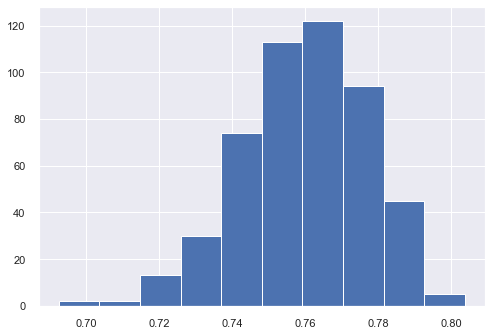

95.0 confidence interval 72.5% and 79.0%


In [206]:
# plot scores

from matplotlib import pyplot
pyplot.hist(stats)
pyplot.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(stats, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

# PRINCIPAL COMPONENT ANALYSIS-PCA

In [207]:
cov_matrix1 = np.cov(x_poly.T)
print('Covariance Matrix \n%s', cov_matrix1)

Covariance Matrix 
%s [[ 1.09215802e+04 -2.48138680e+03 -1.81037890e+02 ... -3.32714645e+07
   1.94154700e+07  5.49324942e+06]
 [-2.48138680e+03  7.44188536e+03  1.95975064e+02 ... -2.09059639e+08
  -2.48474397e+07 -3.20894939e+06]
 [-1.81037890e+02  1.95975064e+02  4.50502833e+02 ...  1.97775885e+07
   1.32511468e+07  3.23203533e+06]
 ...
 [-3.32714645e+07 -2.09059639e+08  1.97775885e+07 ...  4.73412446e+14
   6.81285245e+13  9.74280139e+12]
 [ 1.94154700e+07 -2.48474397e+07  1.32511468e+07 ...  6.81285245e+13
   1.13314423e+13  1.79275767e+12]
 [ 5.49324942e+06 -3.20894939e+06  3.23203533e+06 ...  9.74280139e+12
   1.79275767e+12  3.05471331e+11]]


In [208]:
# Step 2- Get eigen values and eigen vector
eig_vals, eig_vecs = np.linalg.eig(cov_matrix1)
print('Eigen Vectors \n%s', eig_vecs)
print('\n Eigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[ 2.66013177e-08  1.92406923e-07 -5.70344257e-07 ...  5.02265027e-05
   6.27689988e-05  1.36707137e-05]
 [ 1.50583526e-07  1.11178604e-07  2.92087704e-07 ...  2.39030910e-02
   1.63687163e-02  1.28400660e-02]
 [ 2.28866148e-08  3.91228230e-08  2.46125452e-08 ... -5.46984862e-02
   9.19829355e-01 -3.89810384e-03]
 ...
 [-2.01586890e-03 -1.84606270e-02 -8.36309691e-03 ...  1.77445087e-07
   5.60237853e-10  3.01954219e-09]
 [-4.58186232e-04  1.95236548e-04 -1.38412946e-03 ... -2.46781011e-08
   1.52282115e-09 -1.22273964e-09]
 [-4.16082964e-05  3.35120943e-04 -2.33519109e-04 ...  1.29639205e-08
   5.19711975e-10  8.86108962e-10]]

 Eigen Values 
%s [6.61209410e+16 4.05873824e+16 2.74828991e+16 8.13837296e+15
 2.65107840e+15 7.41525102e+14 5.50357742e+14 2.60581643e+14
 2.01847558e+14 1.36085256e+14 7.93075742e+13 6.04832277e+13
 3.91598459e+13 2.20194861e+13 1.87878707e+13 1.52084440e+13
 1.20494273e+13 9.98611653e+12 3.99511292e+12 2.94839947e+12
 2.34242490e+12 1.1196

In [209]:
# the "cumulative variance explained" analysis 
tot = sum(eig_vals)
var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 44.93599162  72.51929958  91.196761    96.72762389  98.5293048
  99.0332475   99.40727229  99.58436436  99.72154058  99.81402453
  99.8679222   99.90902678  99.93563993  99.95060444  99.96337273
  99.97370844  99.98189726  99.98868386  99.99139895  99.99340269
  99.99499461  99.9957555   99.99644817  99.99702682  99.99750774
  99.99793879  99.99823307  99.99851421  99.99873101  99.99892135
  99.99909828  99.99925076  99.99937792  99.99948332  99.99957436
  99.9996411   99.99970178  99.99974918  99.99978867  99.99982624
  99.99985872  99.99988087  99.99989935  99.99991497  99.9999286
  99.999939    99.99994826  99.99995679  99.99996441  99.99997102
  99.99997576  99.99997998  99.99998327  99.99998621  99.99998841
  99.99999045  99.99999201  99.99999341  99.99999463  99.99999577
  99.99999678  99.99999747  99.99999803  99.99999839  99.99999873
  99.99999906  99.99999932  99.99999955  99.99999973  99.99999981
  99.99999985  99.9999999   99.99999992  99.9999

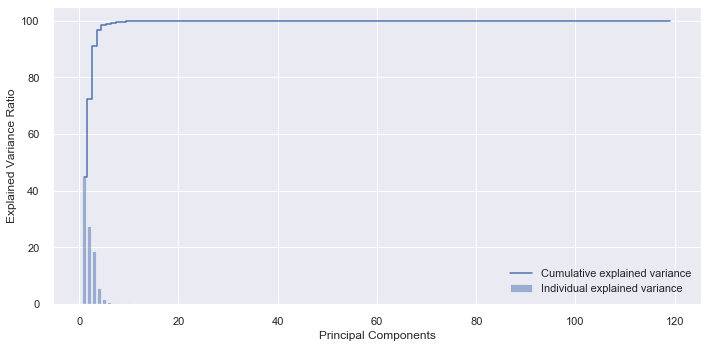

In [210]:
# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [211]:
# print out eigenvalues
print('Eigenvalues in descending order: \n%s' %eig_vals)

Eigenvalues in descending order: 
[6.61209410e+16 4.05873824e+16 2.74828991e+16 8.13837296e+15
 2.65107840e+15 7.41525102e+14 5.50357742e+14 2.60581643e+14
 2.01847558e+14 1.36085256e+14 7.93075742e+13 6.04832277e+13
 3.91598459e+13 2.20194861e+13 1.87878707e+13 1.52084440e+13
 1.20494273e+13 9.98611653e+12 3.99511292e+12 2.94839947e+12
 2.34242490e+12 1.11960786e+12 1.01922790e+12 8.51458332e+11
 7.07641368e+11 6.34269963e+11 4.33013196e+11 4.13684665e+11
 3.19011337e+11 2.80080690e+11 2.60341576e+11 2.24358388e+11
 1.87118383e+11 1.55083465e+11 1.33959299e+11 9.82099605e+10
 8.92867376e+10 6.97432812e+10 5.81076495e+10 5.52816833e+10
 4.77926976e+10 3.26013641e+10 2.71818718e+10 2.29835211e+10
 2.00577335e+10 1.53071205e+10 1.36268275e+10 1.25509939e+10
 1.12114357e+10 9.72521144e+09 6.97243178e+09 6.21653490e+09
 4.84087581e+09 4.32596128e+09 3.23597200e+09 2.99803665e+09
 2.29418377e+09 2.05530858e+09 1.80719513e+09 1.66504892e+09
 1.48907557e+09 1.01831826e+09 8.20674953e+08 5.344

In [212]:
#Importing PCA for dimensionality reduction and visualization
from sklearn.decomposition import PCA
#Reducing to 6 dimension space
pca = PCA(n_components=6)
data_reduced = pca.fit_transform(x_poly)
data_reduced.transpose()

array([[-9.19408204e+07,  3.72714184e+08,  8.12296722e+06, ...,
        -3.37370262e+08, -1.89932360e+08,  4.80430743e+08],
       [ 4.19934719e+07, -7.83328052e+07, -2.37435380e+08, ...,
         1.21582760e+07,  2.29577696e+08,  5.13350570e+08],
       [-2.72602688e+08, -1.64126416e+08,  4.49271563e+07, ...,
        -2.13863547e+07,  4.56447787e+07,  3.45912250e+08],
       [-6.69197640e+07,  1.69324887e+07,  5.55821632e+07, ...,
         2.91441338e+07,  1.23704251e+08, -6.60169204e+07],
       [-3.87274213e+06, -3.95981597e+07, -1.27263718e+07, ...,
        -1.60189712e+07,  1.06803913e+08, -5.57570416e+07],
       [ 2.52881654e+07, -2.94337597e+07,  1.98191890e+07, ...,
        -1.29932550e+07,  1.30345760e+07,  6.20857794e+07]])

In [213]:
pca.components_

array([[-2.66013175e-08, -1.50583526e-07, -2.28866147e-08,
        -4.83344553e-09,  2.92301327e-07,  1.16288480e-08,
        -1.16294196e-10, -1.82290192e-05, -4.03720131e-05,
        -9.02106379e-06, -2.25002534e-06,  6.24978326e-05,
        -2.59718733e-05, -1.10442485e-06, -2.80496724e-05,
        -2.91337333e-05, -1.14535630e-06, -1.27866774e-04,
        -1.13175765e-04, -5.51155683e-06, -8.80445475e-06,
        -9.40606482e-07,  3.04945117e-05, -1.35259879e-05,
        -1.26599425e-06, -8.56087262e-08, -2.75373902e-06,
        -3.92047563e-06, -8.88712131e-08,  5.69951314e-04,
         2.34531084e-04,  9.95170916e-06,  1.33478053e-05,
         1.43141917e-06,  3.61599599e-07, -8.24804661e-03,
        -1.25753698e-02, -3.96850781e-03, -1.02670452e-03,
         1.32551643e-02, -1.96577873e-02, -5.54915589e-04,
        -7.01354478e-03, -7.61748702e-03, -3.45255622e-04,
        -3.44604003e-02, -3.05893654e-02, -1.54045243e-03,
        -2.59111771e-03, -3.94855955e-04,  7.12054509e-0

In [214]:
pca.explained_variance_ # Amount of information or variance each PCA holds after projecting the data to a lower dimensional subspace

array([6.61209410e+16, 4.05873824e+16, 2.74828991e+16, 8.13837296e+15,
       2.65107840e+15, 7.41525102e+14])

In [215]:
print(pca.explained_variance_ratio_)

[0.44935992 0.27583308 0.18677461 0.05530863 0.01801681 0.00503943]


In [216]:
X_new=data_reduced

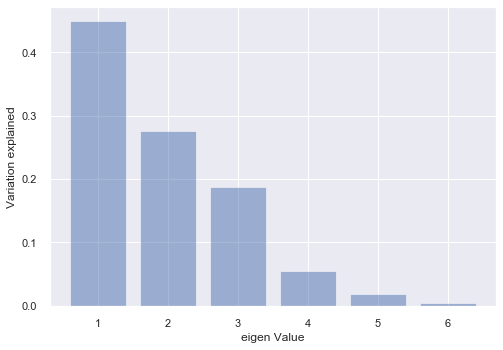

In [217]:
plt.bar(list(range(1,7)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

In [218]:
#PCA TRAIN TEST SPLIT

x_train3, x_test3, y_train3, y_test3 = train_test_split(X_new,y, test_size = 0.3, random_state = 25)

# PCA-DECISION TREE

In [219]:
dt_model3 = DecisionTreeRegressor(random_state=25)
dt_model3.fit(x_train3 , y_train3)
y_pred2=dt_model3.predict(x_test3)
# performance on train data
print('Performance on training data using DT:',dt_model3.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using DT:',dt_model3.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, y_pred2))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3, y_pred2)))
#Evaluate the model using accuracy
acc_DT_pca=metrics.r2_score(y_test3, y_pred2)
print('Accuracy DT_pipeline: ',acc_DT_pca)
mse_dt= mean_squared_error(y_test3, y_pred2)
mse_dt

Performance on training data using DT: 0.9954698895855629
Performance on testing data using DT: 0.753924687495332
MSE:  63.15924627831715
RMSE:  7.9472791745550975
Accuracy DT_pipeline:  0.753924687495332


63.15924627831715

In [220]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Trees-PCA'], 'accuracy': acc_DT_pca ,'mean_squared_error':mse_dt} ,index={'39'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results
       

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# PCA-RANDOM FOREST REGRESSOR

In [221]:
rf_pca=RandomForestRegressor(random_state=25)
rf_pca.fit(x_train3, y_train3)
pred_rf_pca=rf_pca.predict(x_test3) 
# performance on train data
print('Performance on training data using RandomForest:',rf_pca.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using RandomForest:',rf_pca.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, pred_rf_pca))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3, pred_rf_pca)))
#Evaluate the model using accuracy
rf_acc_pca=metrics.r2_score(y_test3,pred_rf_pca)
print('Accuracy Random Forest_pipeline: ',rf_acc_pca)
mse_rf_pca= mean_squared_error(y_test3, pred_rf_pca)
mse_rf_pca

Performance on training data using RandomForest: 0.9803203284804022
Performance on testing data using RandomForest: 0.884403901673759
MSE:  29.669625809623305
RMSE:  5.446983184261111
Accuracy Random Forest_pipeline:  0.884403901673759


29.669625809623305

In [222]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['RandomForest-PCA'], 'accuracy': rf_acc_pca, 'mean_squared_error':mse_rf_pca},index={'40'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# PCA -BAGGING REGRSSOR

In [223]:
model_bg2=BaggingRegressor(n_estimators=100,bootstrap_features= True, bootstrap= True,random_state=5)
model_bg2.fit(x_train3, y_train3)
pred_bg3=model_bg2.predict(x_test3) 
# performance on train data
print('Performance on training data using Baggingclassifier:',model_bg2.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using BaggingClassifier:',model_bg2.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, pred_bg3))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3, pred_bg3)))
#Evaluate the model using accuracy
bg2_acc=metrics.r2_score(y_test3,pred_bg3)
print('Accuracy Bagging Classifier_pipeline: ',bg2_acc)
mse_bg3=mean_squared_error(y_test3, pred_bg3)
print(mse_bg3)

Performance on training data using Baggingclassifier: 0.975887392580807
Performance on testing data using BaggingClassifier: 0.8591465164098467
MSE:  36.152346079254244
RMSE:  6.012682103625157
Accuracy Bagging Classifier_pipeline:  0.8591465164098466
36.152346079254244


In [224]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Bagging-PCA'], 'accuracy': bg2_acc, 'mean_squared_error':mse_bg3},index={'41'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# PCA-GRADIENT BOOST REGRESSOR

In [225]:
model_gb_pca=GradientBoostingRegressor(random_state=99)
model_gb_pca.fit(x_train3, y_train3)
pred_gb_pca=model_gb_pca.predict(x_test3) 
# performance on train data
print('Performance on training data using GradientBoost PCA:',model_gb_pca.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using GradientBoost PCA:',model_gb_pca.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, pred_gb_pca))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3, pred_gb_pca)))
#Evaluate the model using accuracy
acc_gb_pca=metrics.r2_score(y_test3,pred_gb_pca)
print('Accuracy GradientBoost PCA_pipeline: ',acc_gb_pca)
mse_gb_pca=mean_squared_error(y_test3, pred_gb_pca)
print(mse_gb_pca)

Performance on training data using GradientBoost PCA: 0.937472148992326
Performance on testing data using GradientBoost PCA: 0.8702733700147344
MSE:  33.296457449140014
RMSE:  5.770308262921489
Accuracy GradientBoost PCA_pipeline:  0.8702733700147345
33.296457449140014


In [226]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost-PCA'], 'accuracy': acc_gb_pca, 'mean_squared_error':mse_gb_pca},index={'42'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# PCA-LASSO

In [227]:
ls_pca=Lasso(alpha=100,random_state=22)
ls_pca.fit(x_train3,y_train3)


pred_ls_pca=ls_pca.predict(x_test3) 
# performance on train data
print('Performance on training data using LR:',ls_pca.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using LR:',ls_pca.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, pred_ls_pca))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3,pred_ls_pca)))
#Evaluate the model using accuracy
ls_pca_acc=metrics.r2_score(y_test3,pred_ls_pca)
print('Accuracy LR_pipeline: ',ls_pca_acc)
mse_ls_pca= mean_squared_error(y_test3, pred_ls_pca)
mse_ls_pca

Performance on training data using LR: 0.6784700746057063
Performance on testing data using LR: 0.6758269241180688
MSE:  83.20431224094489
RMSE:  9.121639778074163
Accuracy LR_pipeline:  0.6758269241180688


83.20431224094489

In [228]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Lasso-PCA'], 'accuracy': ls_pca_acc, 'mean_squared_error':mse_ls_pca},index={'43'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# PCA-SUPPORT VECTOR REGRESSOR

In [229]:
model_svc_pca = SVR(C=76,gamma='auto')
model_svc_pca.fit(x_train3, y_train3)

y_pred_svc_pca=model_svc_pca.predict(x_test3)
# performance on train data
print('Performance on training data using DT:',model_svc_pca.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using DT:',model_svc_pca.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, y_pred_svc_pca))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3, y_pred_svc_pca)))
#Evaluate the model using accuracy
acc_svc_pca=metrics.r2_score(y_test3,y_pred_svc_pca)
print('Accuracy SVR_pipeline: ',acc_svc_pca)
mse_svc_pca=mean_squared_error(y_test3, y_pred_svc_pca)
mse_svc_pca

Performance on training data using DT: 0.9890307797521709
Performance on testing data using DT: 0.09259747740442148
MSE:  232.89967130324467
RMSE:  15.261050792892496
Accuracy SVR_pipeline:  0.09259747740442148


232.89967130324467

In [230]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['SVR-PCA'], 'accuracy': acc_svc_pca, 'mean_squared_error':mse_svc_pca},index={'44'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# PCA-KNN

In [231]:
knn_pca= KNeighborsRegressor(n_neighbors= 9,metric='cityblock',weights='distance')# taking n_neighbours randomly as 3

knn_pca.fit(x_train3, y_train3)     
y_pred_knn_pca=knn_pca.predict(x_test3)
# performance on train data
print('Performance on training data using DT:',knn_pca.score(x_train3,y_train3))
# performance on test data
print('Performance on testing data using DT:',knn_pca.score(x_test3,y_test3))
print('MSE: ',metrics.mean_squared_error(y_test3, y_pred_knn_pca))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y_test3, y_pred_knn_pca)))
#Evaluate the model using accuracy
acc_knn_pca=metrics.r2_score(y_test3,y_pred_knn_pca)
print('Accuracy KNN_pipeline: ',acc_knn_pca)
mse_knn_pca=mean_squared_error(y_test3, y_pred_knn_pca)
mse_knn_pca

Performance on training data using DT: 0.995472721227706
Performance on testing data using DT: 0.6763065848014376
MSE:  83.08119949581592
RMSE:  9.114888891029661
Accuracy KNN_pipeline:  0.6763065848014376


83.08119949581592

In [232]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['KNN-PCA'], 'accuracy': acc_knn_pca, 'mean_squared_error':mse_knn_pca},index={'45'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy','mean_squared_error']]
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


# K MEANS CLUSTERING-ORIGINAL DATASET

In [233]:
cluster_range = range( 2, 6 )   # expect 3 to four clusters from the pair panel visual inspection hence restricting from 2 to 6
cluster_errors = []
for num_clusters in cluster_range:
  clusters = KMeans( num_clusters, n_init = 5)
  clusters.fit(X)
  labels = clusters.labels_
  centroids = clusters.cluster_centers_
  cluster_errors.append( clusters.inertia_ )
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )
clusters_df[0:15]

,num_clusters,cluster_errors
0,2,6605.694781
1,3,5664.390520
2,4,4845.785733
3,5,4320.105851


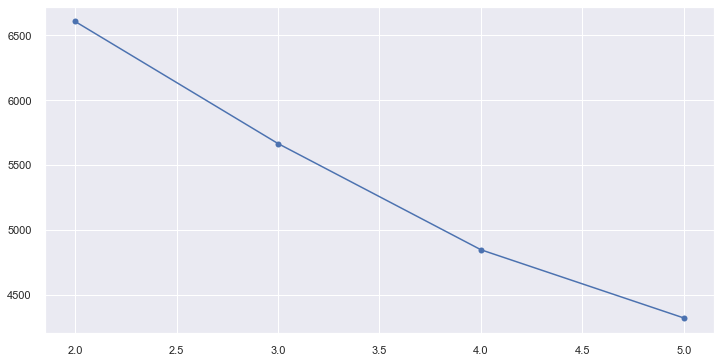

In [234]:
# Elbow plot

plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

In [235]:
z=df1.drop(['strength'],axis=1)

In [236]:
ZScaled=z.apply(zscore)


In [237]:
cluster = KMeans( n_clusters = 4, random_state = 11 )
cluster.fit(z)

prediction=cluster.predict(z)
   # Creating a new column "GROUP" which will hold the cluster id of each record
df1["GROUP"] = prediction
ZScaled["GROUP"] = prediction
print("Groups Assigned : \n")
ZScaled.head() 


Groups Assigned : 



,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,GROUP
0,-1.339017,1.601727,-0.847144,1.034976,-1.061968,-0.014398,-0.312618,-0.281572,2
1,-1.074790,-0.367551,1.096078,-1.095618,0.800217,1.388141,0.285302,-0.673017,0
2,-0.298384,-0.856971,0.648965,0.276070,-0.113633,-0.206121,1.100078,-0.281572,0
3,-0.145209,0.465159,-0.847144,2.189833,-1.061968,-0.526517,-1.296616,-0.281572,2
4,-1.209776,1.270035,-0.847144,0.554178,0.507095,0.958372,-0.961932,-0.281572,2


In [238]:
centroids = cluster.cluster_centers_
centroids

array([[ 218.08977636,   12.39936102,  109.13897764,  172.3586262 ,
           7.56453674, 1019.77092652,  814.12364217,   38.8370607 ],
       [ 385.64330357,   16.48348214,    9.50714286,  192.79553571,
           1.91830357, 1012.60357143,  719.89196429,   48.30357143],
       [ 196.96071429,  179.15660714,   38.71428571,  191.51071429,
           4.3725    ,  952.24464286,  742.94642857,   34.2125    ],
       [ 374.68403756,   86.25117371,   40.76948357,  170.10375587,
          10.90187793,  889.51408451,  810.05293427,   31.25352113]])

In [239]:
centroid_df = pd.DataFrame(centroids, columns = list(z) )
centroid_df

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age
0,218.089776,12.399361,109.138978,172.358626,7.564537,1019.770927,814.123642,38.837061
1,385.643304,16.483482,9.507143,192.795536,1.918304,1012.603571,719.891964,48.303571
2,196.960714,179.156607,38.714286,191.510714,4.372500,952.244643,742.946429,34.212500
3,374.684038,86.251174,40.769484,170.103756,10.901878,889.514085,810.052934,31.253521


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x127cdbf10>,
      dtype=object)

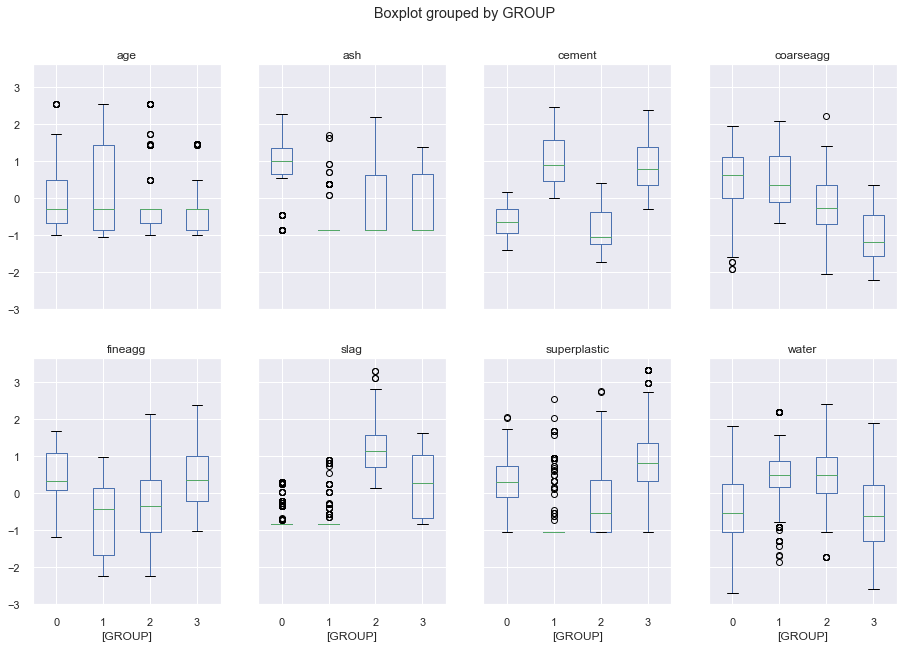

In [240]:
ZScaled.boxplot(by = 'GROUP',  layout=(2,4), figsize=(15, 10))

In [241]:
# Addressing outliers at group level

df_scaled_ot = ZScaled
       
def replace(group):
    median, std = group.median(), group.std()  #Get the median and the standard deviation of every group 
    outliers = (group - median).abs() > 2*std #Subtract median from every member of each group. Take absolute values > 2std
    group[outliers] = group.median()       
    return group

data_corrected = (df_scaled_ot.groupby('GROUP').transform(replace))  
concat_data = data_corrected.join(pd.DataFrame(ZScaled['GROUP']))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x12809e590>,
      dtype=object)

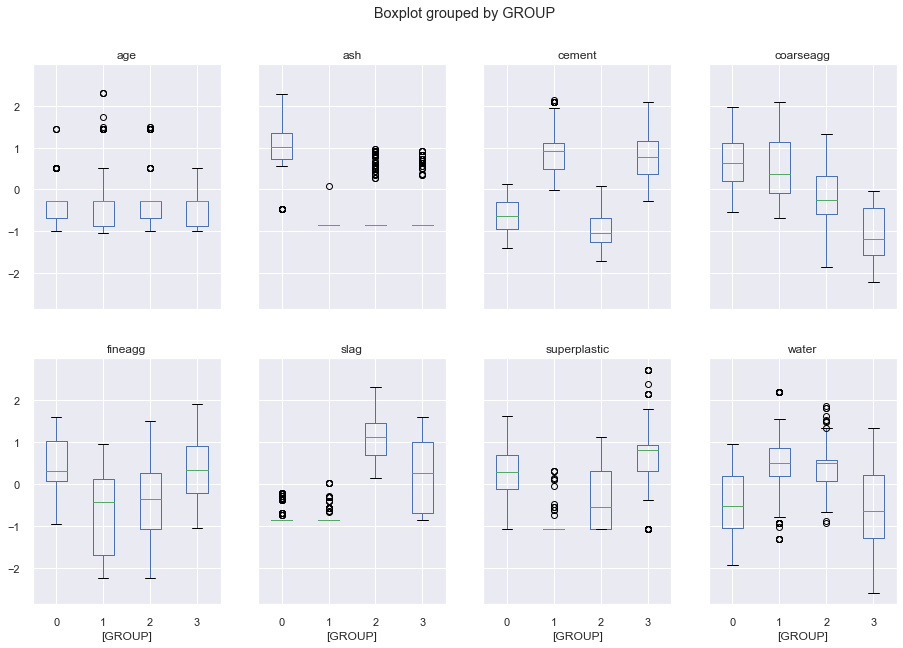

In [242]:
concat_data.boxplot(by = 'GROUP', layout=(2,4), figsize=(15, 10))

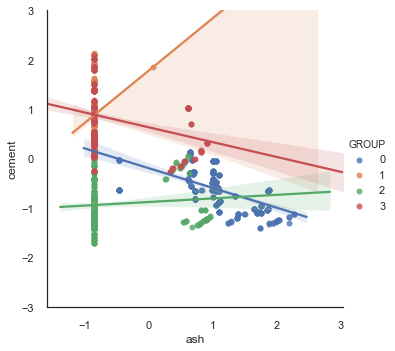

In [243]:
var = 'ash'

with sns.axes_style("white"):
    plot = sns.lmplot(var,'cement',data=concat_data,hue='GROUP')
plot.set(ylim = (-3,3))

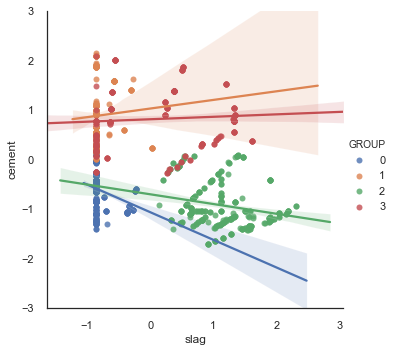

In [244]:
var = 'slag'

with sns.axes_style("white"):
    plot = sns.lmplot(var,'cement',data=concat_data,hue='GROUP')
plot.set(ylim = (-3,3))

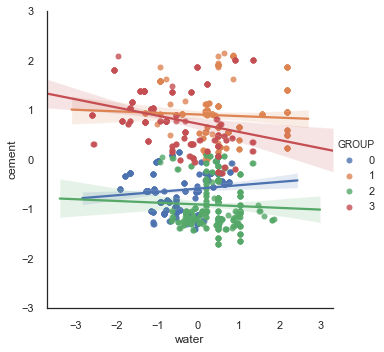

In [245]:
var = 'water'

with sns.axes_style("white"):
    plot = sns.lmplot(var,'cement',data=concat_data,hue='GROUP')
plot.set(ylim = (-3,3))

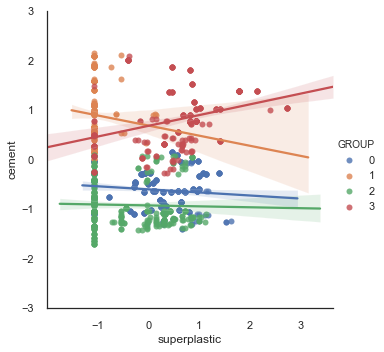

In [246]:
var = 'superplastic'

with sns.axes_style("white"):
    plot = sns.lmplot(var,'cement',data=concat_data,hue='GROUP')
plot.set(ylim = (-3,3))

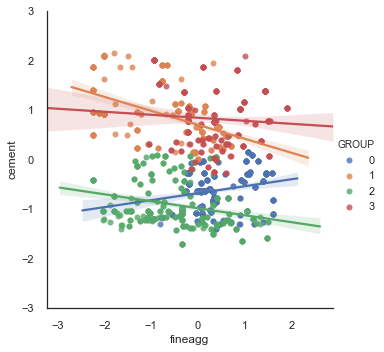

In [247]:
var = 'fineagg'

with sns.axes_style("white"):
    plot = sns.lmplot(var,'cement',data=concat_data,hue='GROUP')
plot.set(ylim = (-3,3))

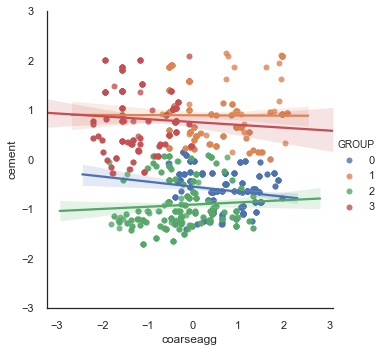

In [248]:
var = 'coarseagg'

with sns.axes_style("white"):
    plot = sns.lmplot(var,'cement',data=concat_data,hue='GROUP')
plot.set(ylim = (-3,3))

In [249]:
# Let us break the data into 3 different groups

largestrength = concat_data[concat_data['GROUP']==0]
smallstrength = concat_data[concat_data['GROUP']==1]
mediumstrength = concat_data[concat_data['GROUP']==2]

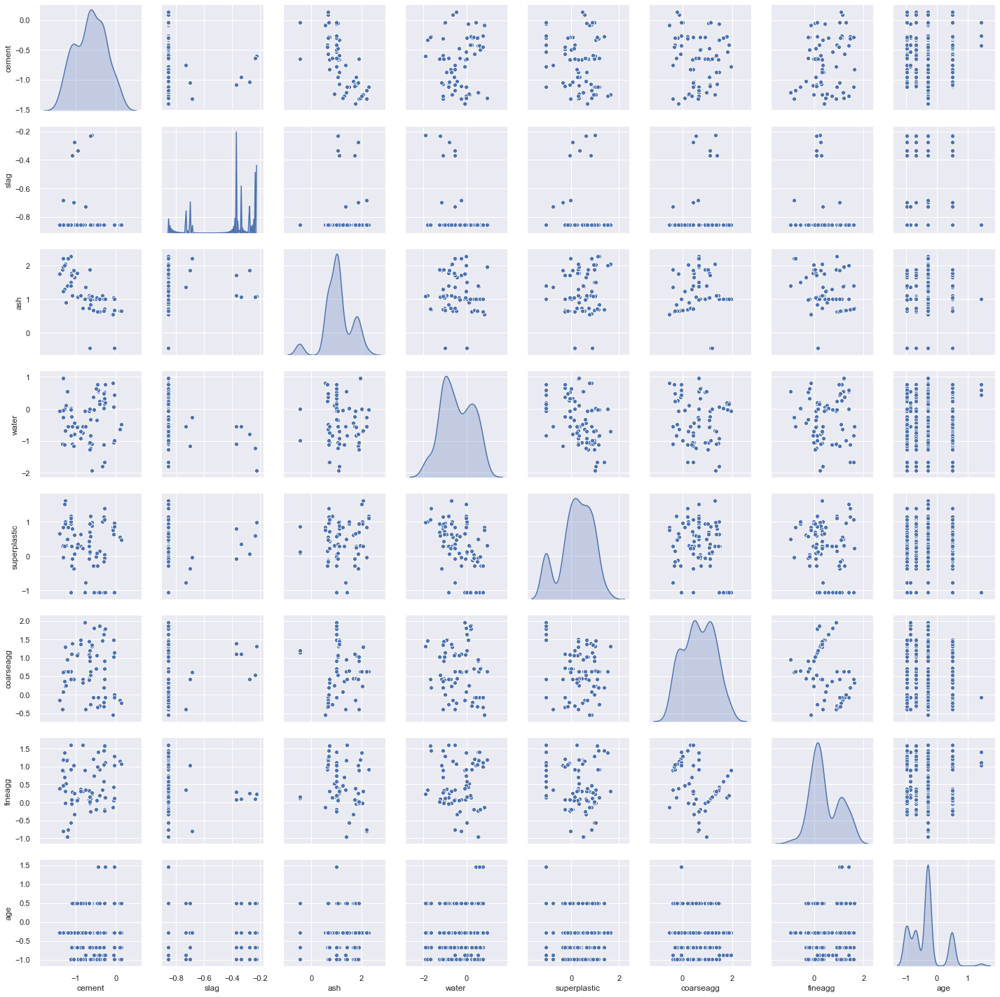

In [250]:
# Let us look at largestrength pair panel

df_large = largestrength.iloc[:, 0:8]   # CHANGE THE STRENGTH TYPE AT THIS POINT TO CHECK HOW THE MODEL PERFORMS FOR EACH GROUP

sns.pairplot(df_large, diag_kind='kde')   # to plot density curve instead of histogram

In [251]:
df_large.shape

(313, 8)

In [252]:
clr = DecisionTreeRegressor()  
array = df_large.values
X = array[:,1:7] 
y = array[:,0]   
X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size=0.30, random_state=25)
clr.fit(X1_train , y1_train)
y_pred = clr.predict(X1_test)



# performance on train data
print('Performance on training data using DT:',clr.score(X1_train,y1_train))
# performance on test data
print('Performance on testing data using DT:',clr.score(X1_test,y1_test))
print('MSE: ',metrics.mean_squared_error(y1_test, y_pred))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y1_test, y_pred)))
#Evaluate the model using accuracy
acc_clu_svc=metrics.r2_score(y1_test,y_pred)
print('Accuracy DT_pipeline: ',acc_clu_svc)
mse_knc=mean_squared_error(y1_test,y_pred)
print(mse_knc)


Performance on training data using DT: 1.0
Performance on testing data using DT: 0.9716774383506873
MSE:  0.0042332540206073245
RMSE:  0.0650634614865158
Accuracy DT_pipeline:  0.9716774383506874
0.0042332540206073245


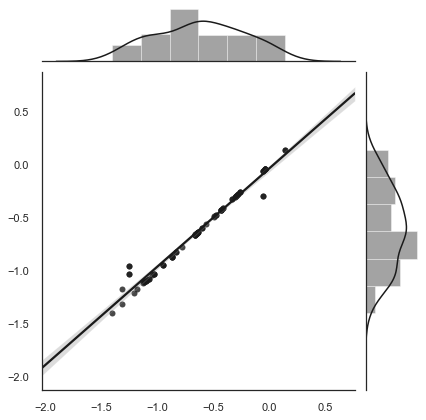

In [253]:
sns.set(style="darkgrid", color_codes=True)
       
with sns.axes_style("white"):
    sns.jointplot(x=y1_test, y=y_pred, kind="reg", color="k");

In [254]:
clr = DecisionTreeRegressor()  
array = df_large.values
X = array[:,1:7] 
y = array[:,0]   
X1_train, X1_test, y1_train, y1_test = train_test_split(X, y, test_size=0.30, random_state=25)
clr.fit(X1_train , y1_train) 
y_pred = clr.predict(X1_test)



# performance on train data
print('Performance on training data using DT:',clr.score(X1_train,y1_train))
# performance on test data
print('Performance on testing data using DT:',clr.score(X1_test,y1_test))
print('MSE: ',metrics.mean_squared_error(y1_test, y_pred))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y1_test, y_pred)))
#Evaluate the model using accuracy
acc_clu_svc=metrics.r2_score(y1_test,y_pred)
print('Accuracy DT_pipeline: ',acc_clu_svc)
mse_knc=mean_squared_error(y1_test,y_pred)
print(mse_knc)



Performance on training data using DT: 1.0
Performance on testing data using DT: 0.9631372116947545
MSE:  0.005509725735128368
RMSE:  0.07422752680191068
Accuracy DT_pipeline:  0.9631372116947545
0.005509725735128368


In [255]:
# Let us break the data into large strength and small strength segments

df_largestrength = df1[df1['strength'] >= 40]   
df_smallstrentgh = df1[df1['strength'] < 40]

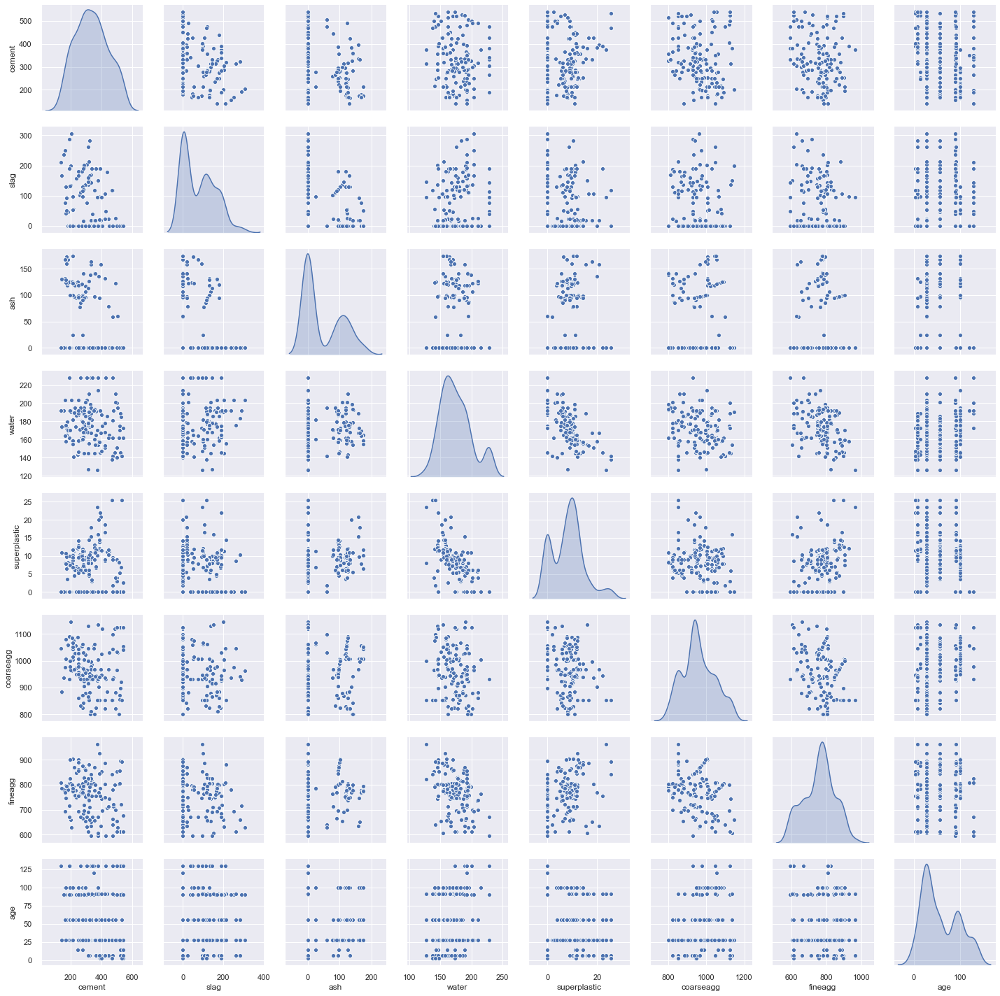

In [256]:
# Let us look at large strength pair panel

df_concrete_new = df_largestrength.iloc[:, 0:8]

sns.pairplot(df_concrete_new, diag_kind='kde')


In [257]:
array = df_concrete_new.values
X = array[:,1:7] 
y = array[:,0]   

X2_train, X2_test, y2_train, y2_test = train_test_split(X, y, test_size=0.30, random_state=25)

In [258]:
clr1 = DecisionTreeRegressor()  
clr1.fit(X2_train , y2_train)

y_pred_clr = clr.predict(X2_test)
# performance on train data
print('Performance on training data using DT:',clr1.score(X2_train,y2_train))
# performance on test data
print('Performance on testing data using DT:',clr1.score(X2_test,y2_test))
print('MSE: ',metrics.mean_squared_error(y2_test, y_pred_clr))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y2_test, y_pred_clr)))
#Evaluate the model using accuracy
acc_clu_svc=metrics.r2_score(y2_test,y_pred_clr)
print('Accuracy SVR_pipeline: ',acc_clu_svc)
mse2_svc=mean_squared_error(y2_test ,y_pred_clr)
mse2_svc

Performance on training data using DT: 1.0
Performance on testing data using DT: 0.8443399144885669
MSE:  130111.10871848681
RMSE:  360.709174707945
Accuracy SVR_pipeline:  -10.562024084172256


130111.10871848681

In [259]:
cols_to_drop = ["water", "coarseagg", "fineagg"]

cement_attr = df_concrete_new.drop(cols_to_drop , axis = 1)

cement_strength = np.array(cement_attr.pop('cement'))

In [260]:
cov_matrix = np.cov(cement_attr, rowvar=False)
np.linalg.eig(cov_matrix)
eigenvalues, eigenvectors, = np.linalg.eig(cov_matrix)
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]
eig_pairs.sort()
eig_pairs.reverse()   
eigvalues_sort = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sort = [eig_pairs[index][1] for index in range(len(eigenvalues))]

In [261]:
tot = sum(eigenvalues)
var_explained = [(i / tot) for i in sorted(eigenvalues, reverse=True)]  
cum_var_exp = np.cumsum(var_explained)
cum_var_exp

array([0.64976221, 0.87446693, 0.99721109, 1.        ])

In [262]:
cement_strength = cement_strength.reshape(len(cement_strength), 1)
eigen_space = np.array(eigvectors_sort[0:1]).transpose()
proj_data_3D = np.dot(cement_attr, eigen_space)
names = ['pc1', 'cement']
cement_pca_array = np.concatenate((proj_data_3D, cement_strength), axis=1)
cement_pca_df = pd.DataFrame(cement_pca_array ,columns=names)
X = cement_pca_array[:,0:1] 
y = cement_pca_array[:,1]  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [263]:
clr1 = DecisionTreeRegressor()  
clr1.fit(X2_train , y2_train)

y_pred_clr = clr.predict(X2_test)
# performance on train data
print('Performance on training data using DT:',clr1.score(X2_train,y2_train))
# performance on test data
print('Performance on testing data using DT:',clr1.score(X2_test,y2_test))
print('MSE: ',metrics.mean_squared_error(y2_test, y_pred_clr))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y2_test, y_pred_clr)))
#Evaluate the model using accuracy
acc_clu_svc=metrics.r2_score(y2_test,y_pred_clr)
print('Accuracy SVR_pipeline: ',acc_clu_svc)
mse2_svc=mean_squared_error(y2_test ,y_pred_clr)
mse2_svc

Performance on training data using DT: 1.0
Performance on testing data using DT: 0.8612489735814853
MSE:  130111.10871848681
RMSE:  360.709174707945
Accuracy SVR_pipeline:  -10.562024084172256


130111.10871848681

In [264]:
clr.fit(X1_train , y1_train) 
y_pred = clr.predict(X1_test)



# performance on train data
print('Performance on training data using DT:',clr.score(X1_train,y1_train))
# performance on test data
print('Performance on testing data using DT:',clr.score(X1_test,y1_test))
print('MSE: ',metrics.mean_squared_error(y1_test, y_pred))
print('RMSE: ',np.sqrt(metrics.mean_squared_error(y1_test, y_pred)))
#Evaluate the model using accuracy
acc_clu_svc=metrics.r2_score(y1_test,y_pred)
print('Accuracy DT_pipeline: ',acc_clu_svc)
mse_knc=mean_squared_error(y1_test,y_pred)
print(mse_knc)




Performance on training data using DT: 1.0
Performance on testing data using DT: 0.772622099777932
MSE:  0.03398521723530904
RMSE:  0.18435079938885277
Accuracy DT_pipeline:  0.7726220997779318
0.03398521723530904


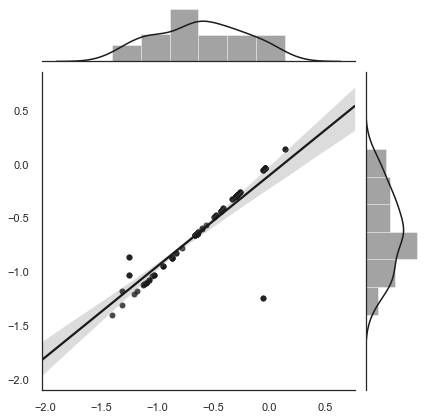

In [265]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y1_test, y=y_pred, kind="reg", color="k");

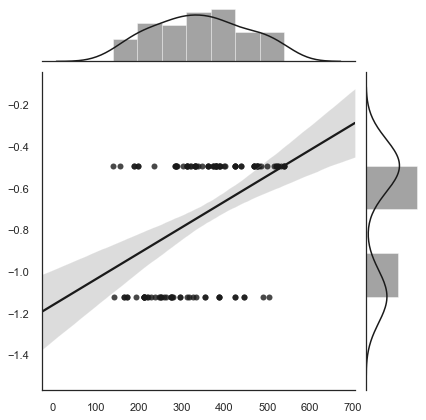

In [266]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y2_test, y=y_pred_clr, kind="reg", color="k");

### Here, None of the dimensions are good predictor of target variable.-K MEANS CLUSTERING

For all the dimensions (variables) every cluster have a similar range of values except in one case.
We can see that the body of the cluster are overlapping.
So in k means, though, there are clusters in datasets on different dimensions. But we can not see any distinct characteristics of these clusters which tell us to break data into different clusters and build separate models for them..

In [267]:
results

,Method,accuracy,mean_squared_error
1,Decision Tree,0.813309,47.917354
2,Decision Tree-Pipeline-removing unimportant fe...,0.811457,48.392672
3,Decision Tree- Polynomial feature,0.821449,45.828103
4,Decision Tree Polynomial -Gridsearch,0.766393,59.959027
5,Decision Tree -Polynomial K fold,0.846846,NaN
6,RandomForest-Polynomial,0.915727,21.630014
7,RandomForest-Polynomial Gridsearch,0.865195,34.599814
8,RandomForest-Polynomial-kfold,0.911603,NaN
9,Bagging-Polynomial,0.908678,23.439252
10,Bagging-Polynomial Gridsearch,0.919989,20.536198


#    WHICH MODEL IS BETTER?

Concrete is one of preferred choice among contractors and builders for construction projects. The right combination of constituents is important to get a premium quality concrete mix. Reliability and durability are things that cannot be compromised upon infrastructure projects.
Using machine learning models, we were able to deduce the importance of concrete mix constituents on compressive strength.
Already such inferences can provide a lot of business value to a prospective client. More research and work with engineers can add tremendous value by finding answers to problems.

GRADIENT BOOST AND EXTRA TREES BOTH THE MODELS ARE PERFORMING GOOD .
EXTRA TREES KFOLD ACCURACY IS 92.01% WITH MSE=19.41 WHERE AS GRADEINT BOOST ACCURACY IS 91.48% WITH MSE=19.618.

BOTH THE RESULTS ARE CLOSEBY WITH EXTRA TREES ON A BIT HIGHER SIDE.